In [26]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns


In [27]:
df=pd.read_csv('merged_data.csv')

In [28]:
df.head(2)

,gadm_id,gadm_name,gadm_level,gadm0_name,gadm1_name,gadm2_name,country,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds
0,LUX,Luxembourg,0,Luxembourg,NaN,NaN,LU,Retail,0.550204,116.600990,2020-03-01,2020-03-01
1,LUX,Luxembourg,0,Luxembourg,NaN,NaN,LU,Home Services,0.641146,113.705543,2020-03-01,2020-03-01


In [29]:
df.shape

(2396549, 12)

In [30]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2396549 entries, 0 to 2396548
Data columns (total 12 columns):
 #   Column               Dtype  
---  ------               -----  
 0   gadm_id              object 
 1   gadm_name            object 
 2   gadm_level           int64  
 3   gadm0_name           object 
 4   gadm1_name           float64
 5   gadm2_name           float64
 6   country              object 
 7   business_vertical    object 
 8   activity_quantile    float64
 9   activity_percentage  float64
 10  crisis_ds            object 
 11  ds                   object 
dtypes: float64(4), int64(1), object(7)
memory usage: 219.4+ MB


In [31]:
round(df.isnull().sum()/len(df)*100,2)

gadm_id                  0.00
gadm_name                0.00
gadm_level               0.00
gadm0_name               0.00
gadm1_name             100.00
gadm2_name             100.00
country                  1.59
business_vertical        0.00
activity_quantile        0.00
activity_percentage      0.00
crisis_ds                0.00
ds                       0.00
dtype: float64

1. Covid-19 is a global level crisis , hence there will be no value for the state level or county level , hence dropping the columns (gadm1_name,gadm2_name)
2. we have the expanded form of the country name in the column gadm_name, Hence country column is no longer required
3. reduntant columns removed (gadm0_name) 
4. gadm_id - not required since we have the country name
5. gadm_level not required as it is a global crisis the level will always be zero indicating covid-19 has affected the country as a whole

In [32]:
df=df.drop(['gadm_id','gadm0_name','gadm1_name','gadm2_name', 'country','gadm_level'],axis=1)

In [33]:
df.head()

,gadm_name,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds
0,Luxembourg,Retail,0.550204,116.600990,2020-03-01,2020-03-01
1,Luxembourg,Home Services,0.641146,113.705543,2020-03-01,2020-03-01
2,Luxembourg,Local Events,0.663123,103.226699,2020-03-01,2020-03-01
3,Luxembourg,Manufacturing,0.504707,103.525641,2020-03-01,2020-03-01
4,Czech Republic,All,0.583032,108.645654,2020-03-01,2020-03-01


1. Creating new columns such as year , month and year

In [34]:
df['ds']=pd.to_datetime(df['ds'])
df['crisis_ds']=pd.to_datetime(df['crisis_ds'])

In [35]:
df['days_report']=df['ds']-df['crisis_ds']

The dataset contains business posting for 1004 consecutive days from the start date of crisis across different countries and economic sectors

In [36]:
df.gadm_name.nunique()

220

In [37]:
df.head(1)

,gadm_name,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds,days_report
0,Luxembourg,Retail,0.550204,116.60099,2020-03-01,2020-03-01,0 days


In [38]:
#df['ds'].dt.to_period('M')

In [47]:
df['dates']=pd.to_datetime(df['ds']).dt.strftime('%b %-d,%Y')

In [48]:
df.head(2)

,gadm_name,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds,days_report,dates
0,Luxembourg,Retail,0.550204,116.600990,2020-03-01,2020-03-01,0 days,"Mar 1,2020"
1,Luxembourg,Home Services,0.641146,113.705543,2020-03-01,2020-03-01,0 days,"Mar 1,2020"


In [49]:
#df['dates']=pd.to_datetime(df['dates'],format='%b %d,%Y')

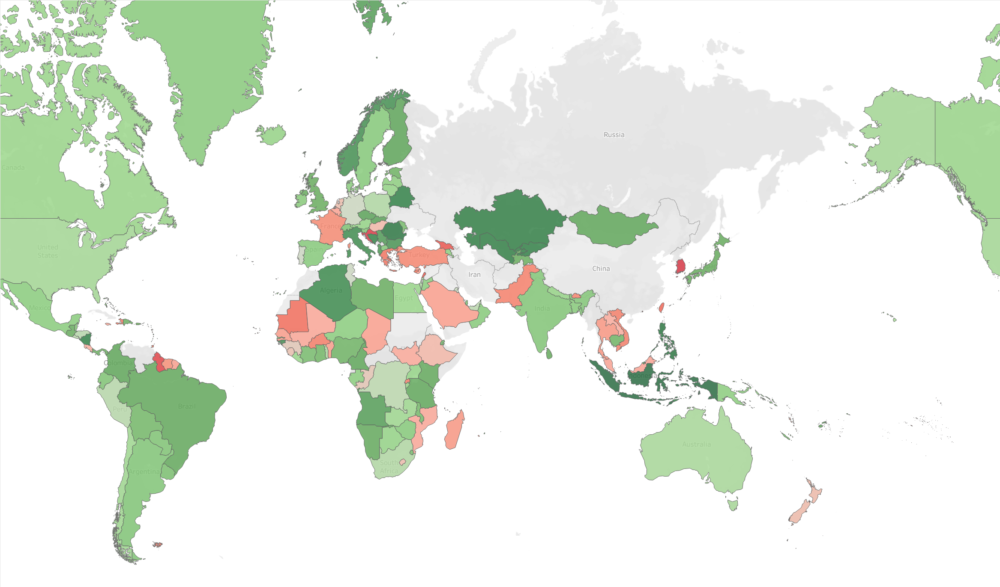

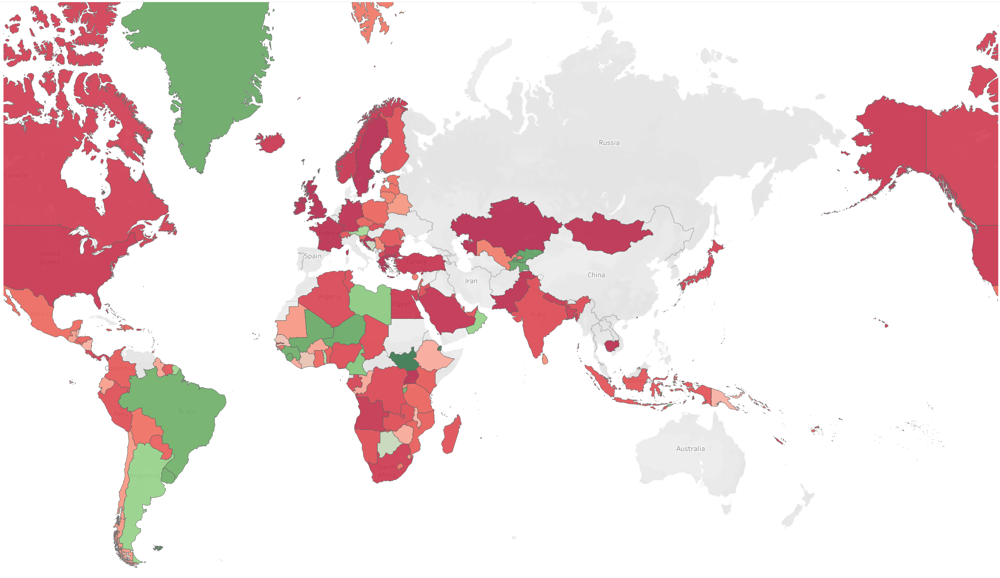

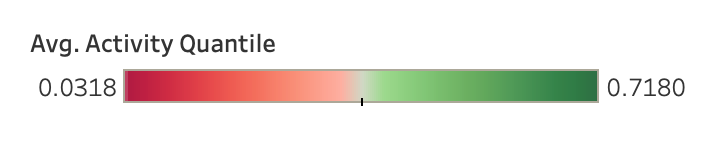

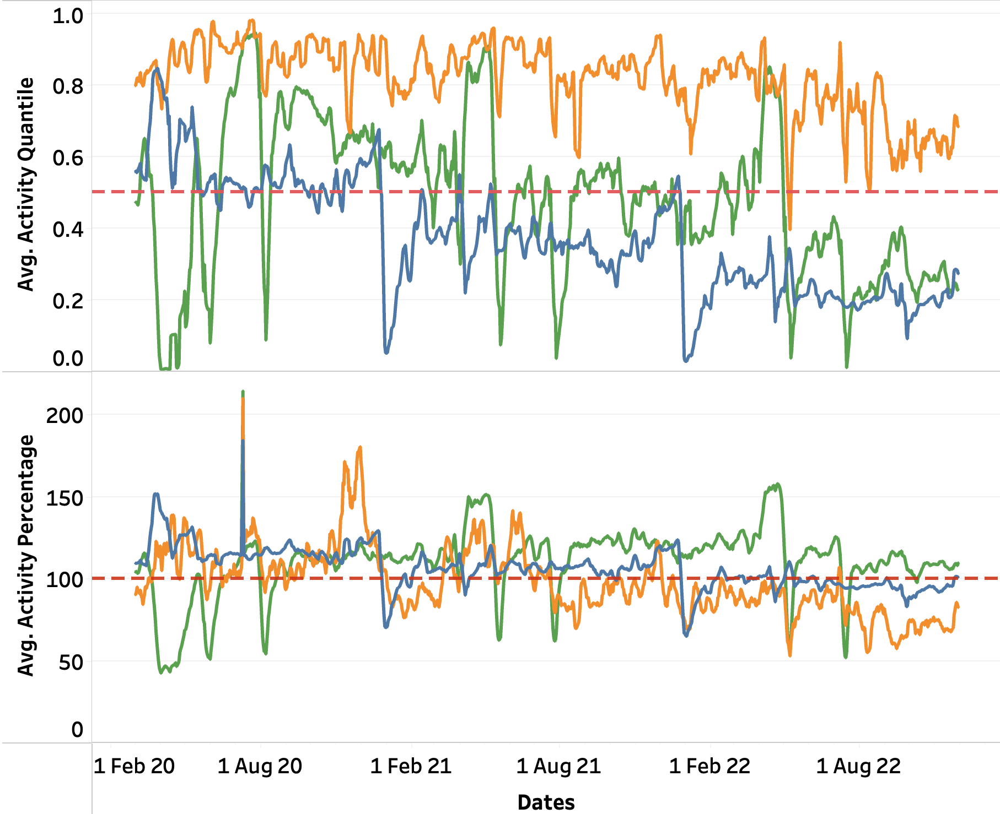

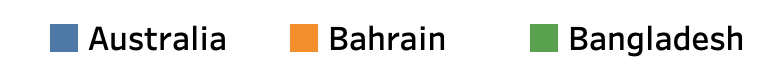

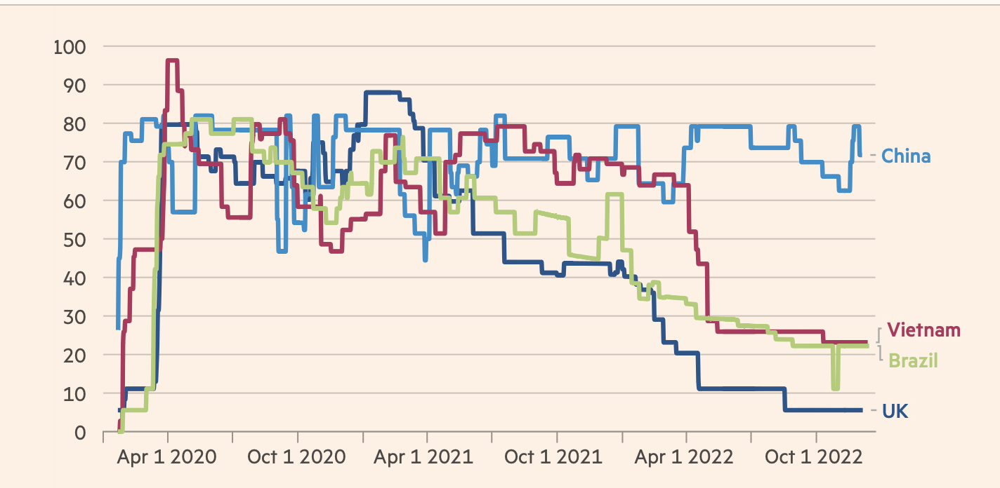

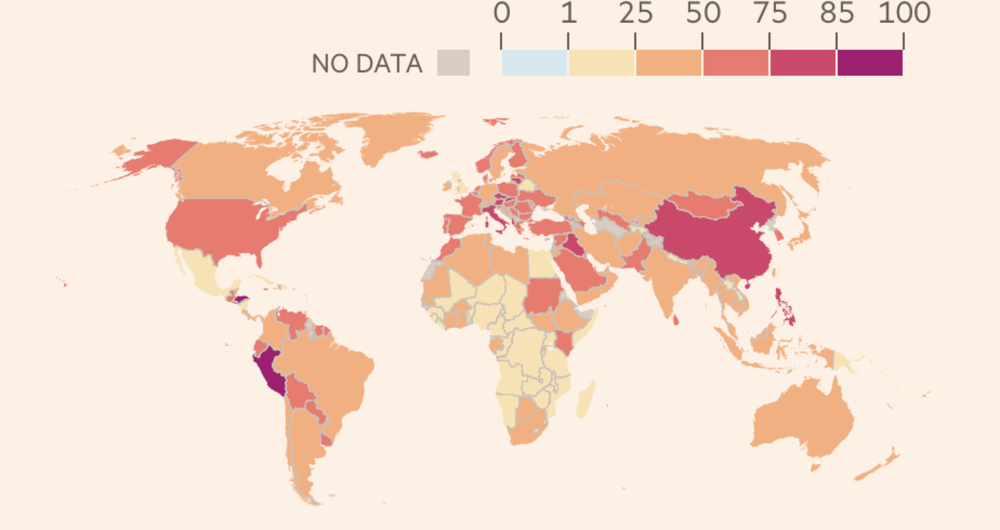

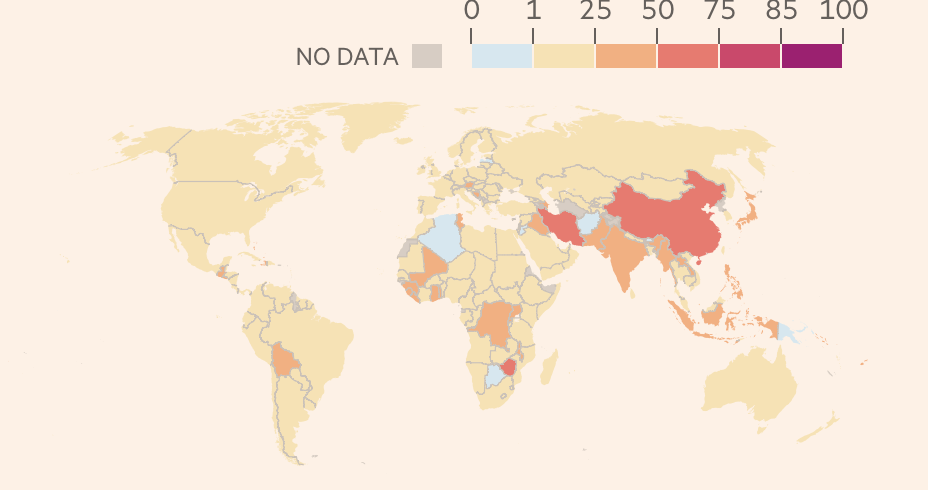

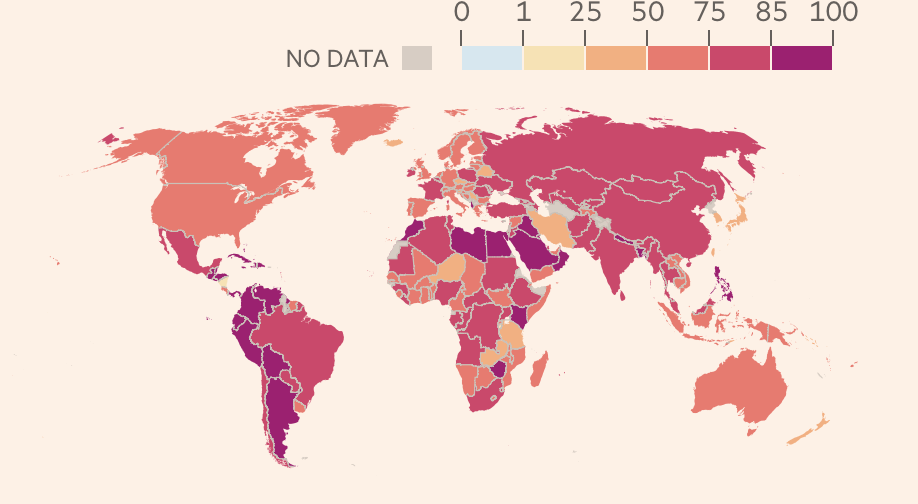

In [78]:
Adf.head(2)

,gadm_name,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds,days_report,dates,weekday,week_no,year,month,quarter,period
0,Luxembourg,Retail,0.550204,116.600990,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1,"Mar 1,2020"
1,Luxembourg,Home Services,0.641146,113.705543,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1,"Mar 1,2020"


In [79]:
df['weekday']=pd.to_datetime(df['ds']).dt.strftime('%a')

In [80]:
df['week_no']=pd.to_datetime(df['ds']).dt.strftime('%U')

In [81]:
df['year']=pd.to_datetime(df['ds']).dt.strftime('%Y')

In [ ]:
df['dates']=pd.to_datetime(df['ds']).dt.strftime('%b %-d,%Y')
df['weekday']=pd.to_datetime(df['ds']).dt.strftime('%a')
df['week_end']=df['weekday'].apply(lambda x:'Yes' if x in ['Sat','Sun'] else 'No')
df['week_no']=pd.to_datetime(df['ds']).dt.strftime('%U')
df['year']=pd.to_datetime(df['ds']).dt.strftime('%Y')
df['month']=pd.to_datetime(df['ds']).dt.strftime('%b')

In [66]:
df['quarter']=pd.to_datetime(df['ds']).dt.quarter
df['period']=''
df.loc[((df.quarter==1)&(df['year']=='2020')),'period']='Mar 1,2020'
df.loc[((df.quarter==1)&(df['year']=='2021')),'period']='Jan 1,2021'
df.loc[((df.quarter==1)&(df['year']=='2022')),'period']='Feb 1,2022'
df.loc[((df.quarter==2)&(df['year']=='2020')),'period']='May 1,2020'
df.loc[((df.quarter==2)&(df['year']=='2021')),'period']='Apr 1,2021'
df.loc[((df.quarter==2)&(df['year']=='2022')),'period']='Jun 1,2022'
df.loc[((df.quarter==3)&(df['year']=='2020')),'period']='Aug 1,2020'
df.loc[((df.quarter==3)&(df['year']=='2021')),'period']='Jul 1,2020'
df.loc[((df.quarter==3)&(df['year']=='2022')),'period']='Sep 1,2020'
df.loc[((df.quarter==4)&(df['year']=='2020')),'period']='Nov 1,2020'
df.loc[((df.quarter==4)&(df['year']=='2021')),'period']='Oct 1,2021'
df.loc[((df.quarter==4)&(df['year']=='2022')),'period']='Dec 1,2022'

In [82]:
df['month']=pd.to_datetime(df['ds']).dt.strftime('%b')

In [106]:
#df.groupby(['week_no','year'])['activity_quantile'].mean().plot(kind='line')

In [105]:
#df.groupby(['year'])['activity_quantile'].mean().plot(kind='bar')

In [121]:
#df1=df[df['year']=='2022']
#df1.head()

In [120]:
#df1.groupby(['week_no'])['activity_quantile'].mean().plot(kind='bar')

([0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11],
 [Text(0, 0, 'Mar 1,2020'),
  Text(1, 0, 'May 1,2020'),
  Text(2, 0, 'Aug 1,2020'),
  Text(3, 0, 'Nov 1,2020'),
  Text(4, 0, 'Jan 1,2021'),
  Text(5, 0, 'Apr 1,2021'),
  Text(6, 0, 'Jul 1,2020'),
  Text(7, 0, 'Oct 1,2021'),
  Text(8, 0, 'Feb 1,2022'),
  Text(9, 0, 'Jun 1,2022'),
  Text(10, 0, 'Sep 1,2020'),
  Text(11, 0, 'Dec 1,2022')])

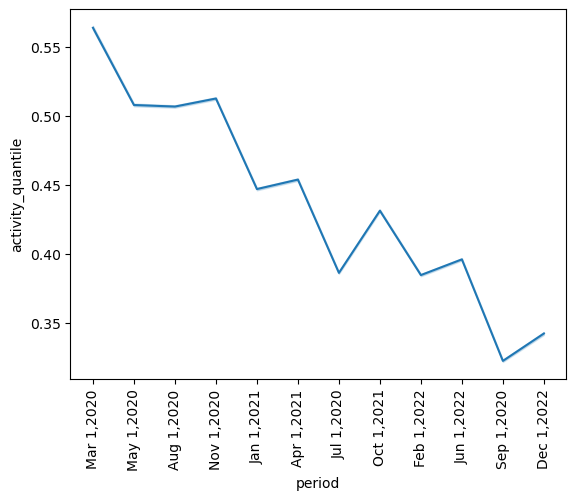

In [76]:
sns.lineplot(x=df['period'],y=df['activity_quantile'])
plt.xticks(rotation=90)

In [146]:
df.head(1)

,gadm_name,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds,days_report,dates,weekday,year,week_no,month
0,Luxembourg,Retail,0.550204,116.60099,2020-03-01,2020-03-01,0 days,2020-03-01,Sun,2020,09,Mar


In [83]:
df['week_end']=df['weekday'].apply(lambda x:'Yes' if x in ['Sat','Sun'] else 'No')

In [84]:
df.head()

,gadm_name,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds,days_report,dates,weekday,week_no,year,month,quarter,period,week_end
0,Luxembourg,Retail,0.550204,116.600990,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1,"Mar 1,2020",Yes
1,Luxembourg,Home Services,0.641146,113.705543,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1,"Mar 1,2020",Yes
2,Luxembourg,Local Events,0.663123,103.226699,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1,"Mar 1,2020",Yes
3,Luxembourg,Manufacturing,0.504707,103.525641,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1,"Mar 1,2020",Yes
4,Czech Republic,All,0.583032,108.645654,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1,"Mar 1,2020",Yes


In [23]:
dfsaudia=df[df['gadm_name']=='Saudi Arabia']


<Axes: xlabel='business_vertical'>

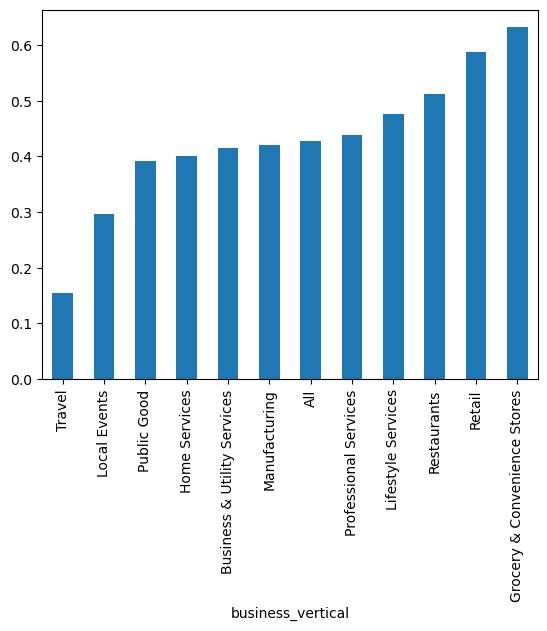

In [25]:
df[df['gadm_name']=='Saudi Arabia'].groupby('business_vertical')['activity_quantile'].mean().sort_values().plot(kind='bar')

In [ ]:
sns.boxenplot(x=df['week_end'],y=df['activity_quantile'])

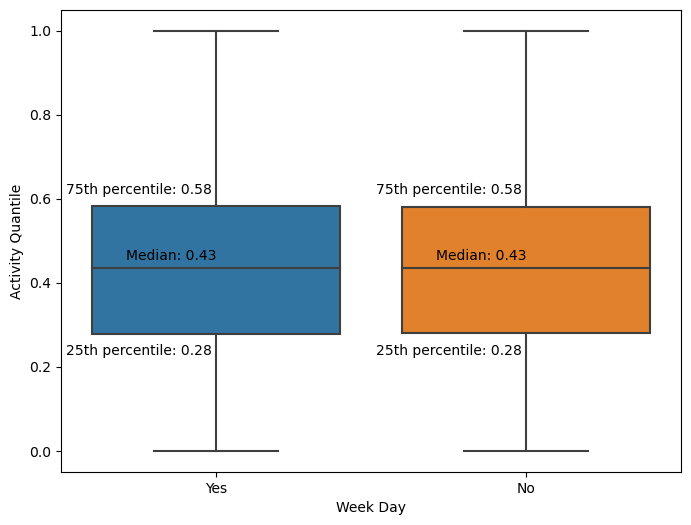

In [93]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['week_end'],y=df['activity_quantile'])

medians = df.groupby(['week_end'])['activity_quantile'].median()
upper_quartiles = df.groupby(['week_end'])['activity_quantile'].quantile(0.75)
lower_quartiles = df.groupby(['week_end'])['activity_quantile'].quantile(0.25)

for xtick in plt.gca().get_xticks():
    plt.text(xtick, upper_quartiles[xtick]+0.03, f'75th percentile: {upper_quartiles[xtick]:.2f} ', horizontalalignment='right', color='black', )
    plt.text(xtick, lower_quartiles[xtick]-0.05, f'25th percentile: {lower_quartiles[xtick]:.2f} ', horizontalalignment='right', color='black', )
    plt.text(xtick, medians[xtick]+0.02, f'Median: {medians[xtick]:.2f}', horizontalalignment='right', color='black')
plt.xlabel('Week Day')
plt.ylabel('Activity Quantile')x
plt.show()

<Axes: xlabel='week_end', ylabel='activity_quantile'>

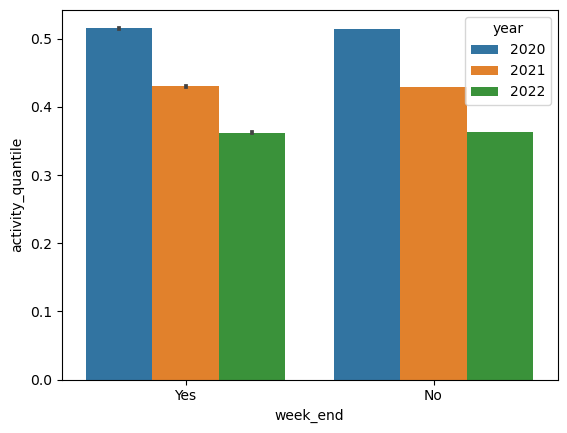

In [92]:
sns.barplot(x=df['week_end'],y=df['activity_quantile'],hue=df['year'])

<Axes: xlabel='week_end', ylabel='activity_quantile'>

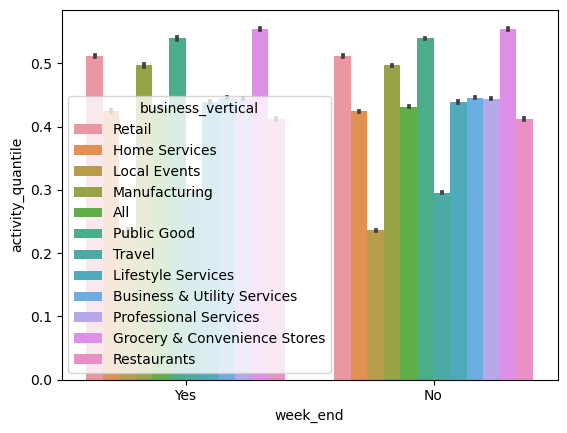

In [95]:
sns.barplot(x=df['week_end'],y=df['activity_quantile'],hue=df['business_vertical'])

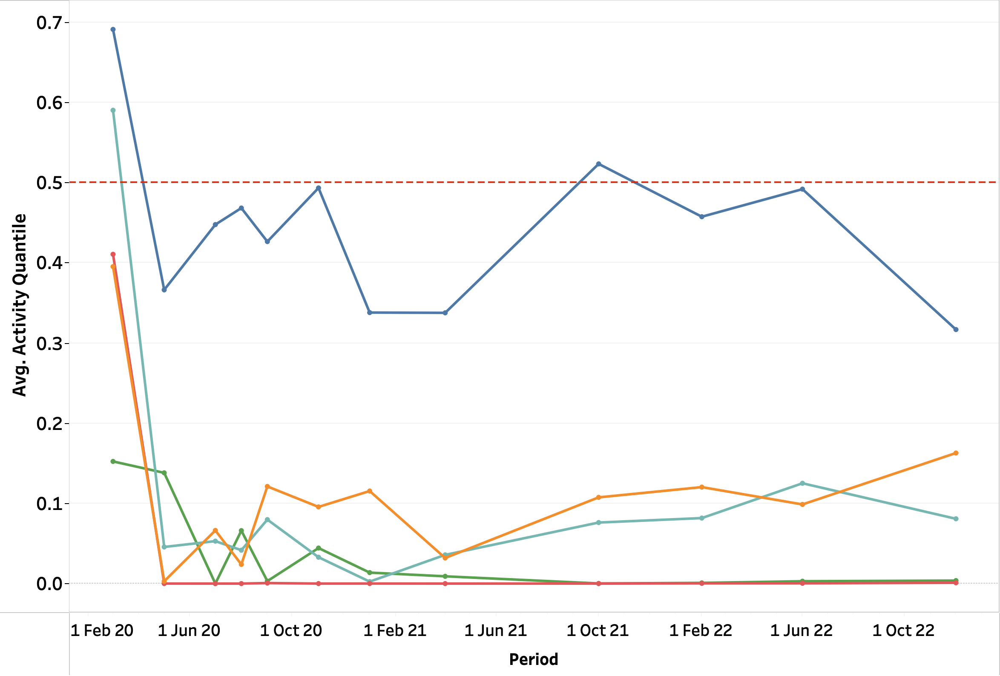

In [7]:

df.groupby(['gadm_name','business_vertical'])['ds'].count()

gadm_name              business_vertical    
Akrotiri and Dhekelia  All                      1004
                       Home Services            1004
                       Lifestyle Services       1004
                       Local Events             1004
                       Professional Services    1004
                                                ... 
Åland                  Professional Services    1004
                       Public Good              1004
                       Restaurants              1004
                       Retail                   1004
                       Travel                   1004
Name: ds, Length: 2388, dtype: int64

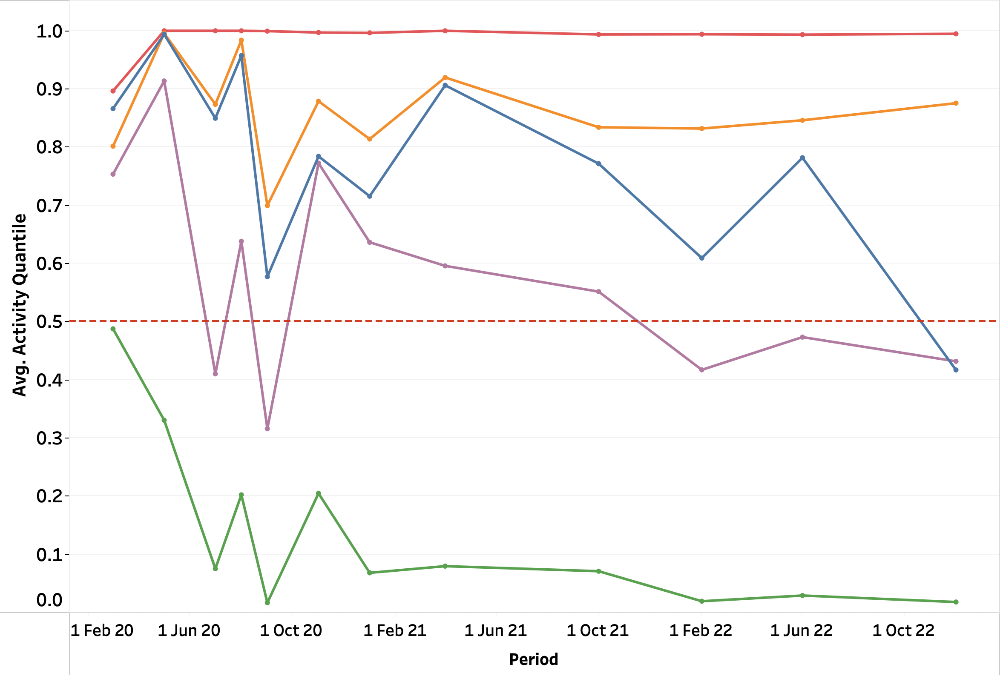

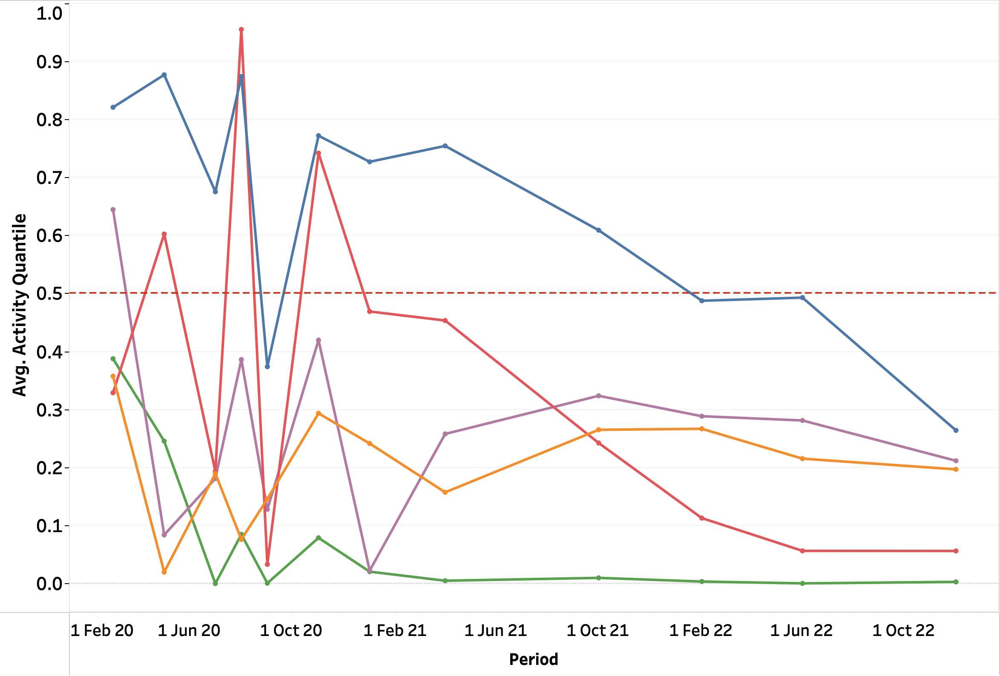

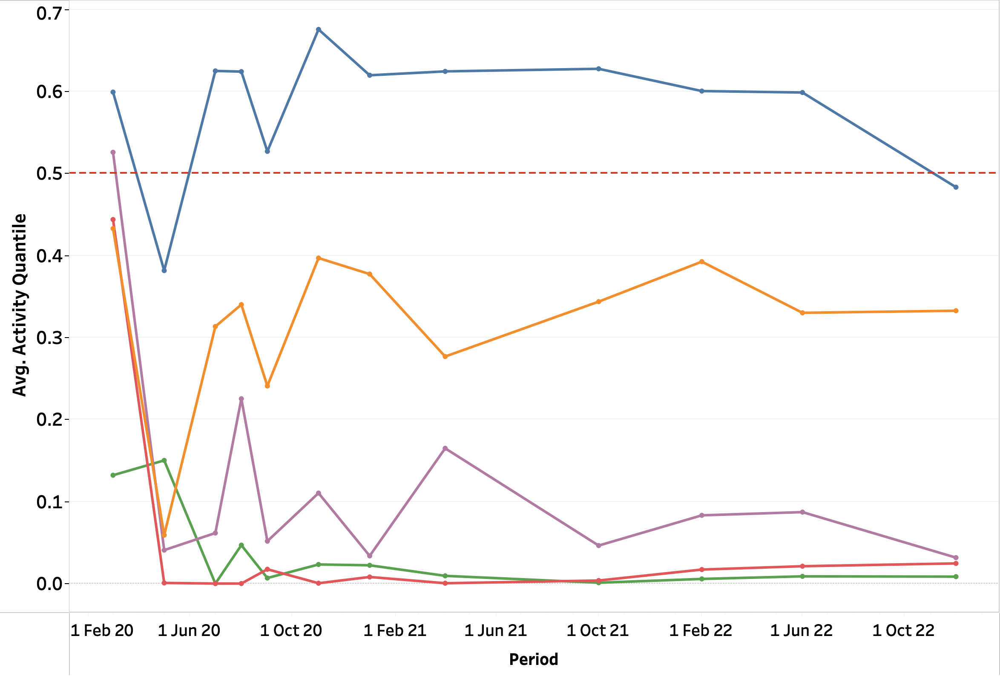

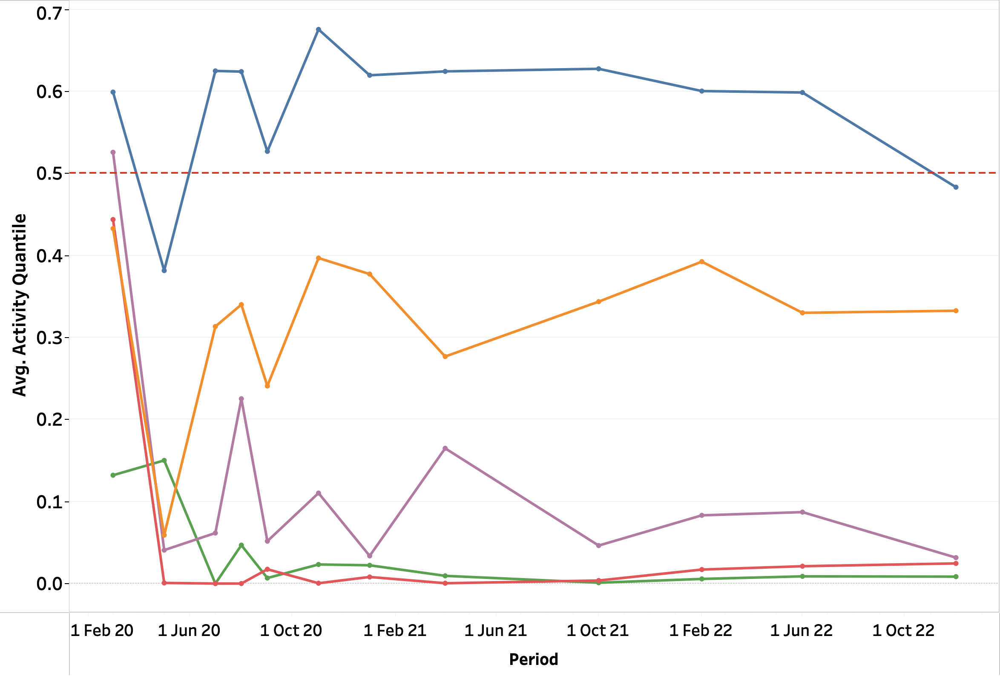

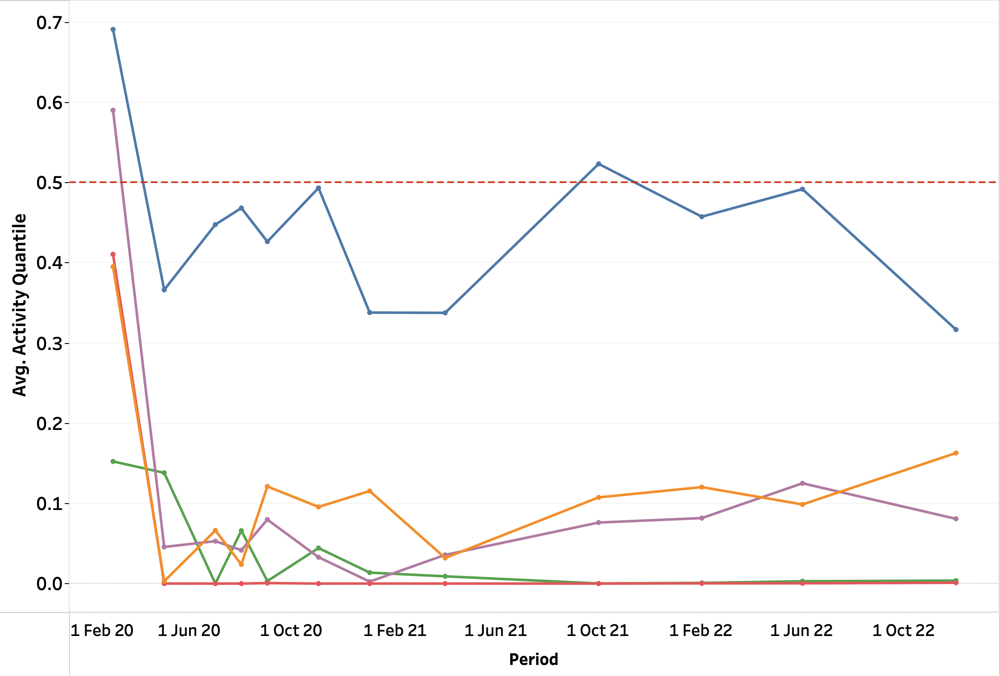

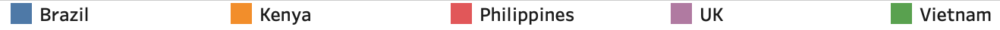

In [8]:
df.groupby(['gadm_name'])['ds'].count()

gadm_name
Akrotiri and Dhekelia     7028
Albania                  12048
Algeria                  12048
American Samoa            6024
Andorra                  12048
                         ...  
Vietnam                  12048
Virgin Islands, U.S.     12048
Zambia                   12048
Zimbabwe                 12048
Åland                    12048
Name: ds, Length: 220, dtype: int64

In [22]:
df.groupby(['year','month','week_end'])['activity_quantile'].mean()

year  month  week_end
2020  Apr    No          0.446215
             Yes         0.442799
      Aug    No          0.482065
             Yes         0.484874
      Dec    No          0.513976
                           ...   
2022  Nov    Yes         0.344162
      Oct    No          0.342229
             Yes         0.338979
      Sep    No          0.322853
             Yes         0.325109
Name: activity_quantile, Length: 66, dtype: float64

In [23]:
df[(df['year']=="2020") & (df['month']=="Mar")].groupby('weekday')['activity_quantile'].mean()

weekday
Fri    0.567327
Mon    0.557442
Sat    0.566498
Sun    0.560997
Thu    0.570988
Tue    0.553707
Wed    0.575783
Name: activity_quantile, dtype: float64

<Axes: xlabel='weekday'>

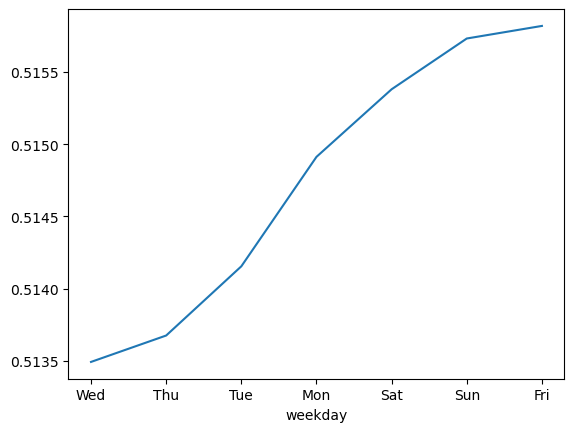

In [24]:
df[(df['year']=="2020") ].groupby('weekday')['activity_quantile'].mean().sort_values(ascending=True).plot(kind='line')

In [25]:
df[(df['year']=="2020") & (df['month']=="Apr")].groupby('weekday')['activity_quantile'].mean()

weekday
Fri    0.441939
Mon    0.444762
Sat    0.442289
Sun    0.443310
Thu    0.449463
Tue    0.446306
Wed    0.447478
Name: activity_quantile, dtype: float64

In [26]:
df[df['weekday']=='Sun']['activity_quantile'].mean()

0.43373796562584566

In [27]:
df[(df['year']=="2020") & (df['weekday']=='Sun')]['activity_quantile'].mean()

0.5157308246854656

In [28]:
df[(df['year']=="2020") & (df['weekday']=='Sun') &(df['week_no']=='08')]['activity_quantile'].mean()

nan

In [29]:
df[(df['year']=="2020") & (df['weekday']=='Sun') &(df['week_no']=='16')]['activity_quantile'].mean()

0.4109830276538245

In [30]:
df[(df['year']=="2020") & (df['weekday']=='Sun') &(df['week_no']=='24')]['activity_quantile'].mean()

0.5466772568572246

In [31]:
df[(df['year']=="2020") & (df['weekday']=='Sun') &(df['week_no']=='32')]['activity_quantile'].mean()

0.4755065162626889

In [32]:
df[(df['year']=="2020") & (df['weekday']=='Sun') &(df['week_no']=='40')]['activity_quantile'].mean()

0.5200906469022951

<Axes: xlabel='week_no'>

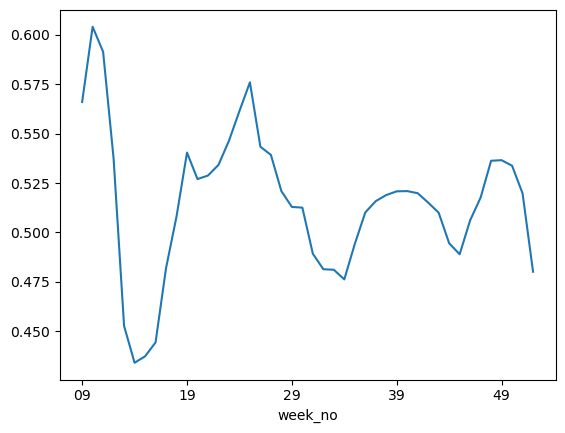

In [33]:
df[(df['year']=="2020") & (df['week_end']=='Yes')].groupby('week_no')['activity_quantile'].mean().plot(kind='line')

<Axes: xlabel='week_no'>

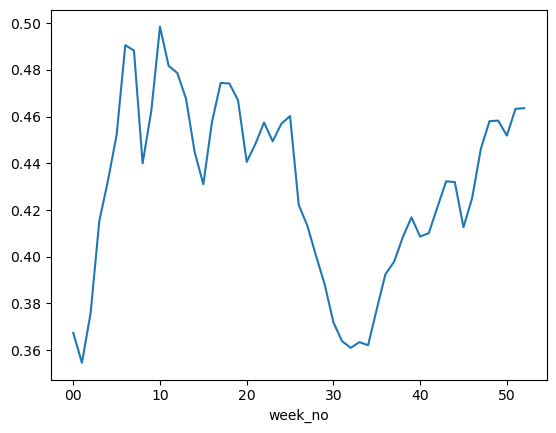

In [34]:
df[(df['year']=="2021") & (df['week_end']=='Yes')].groupby('week_no')['activity_quantile'].mean().plot(kind='line')

<Axes: xlabel='week_no'>

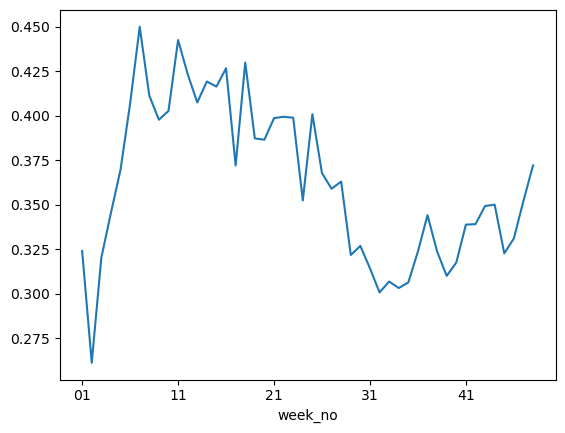

In [35]:
df[(df['year']=="2022") & (df['weekday']=='Sun')].groupby('week_no')['activity_quantile'].mean().plot(kind='line')

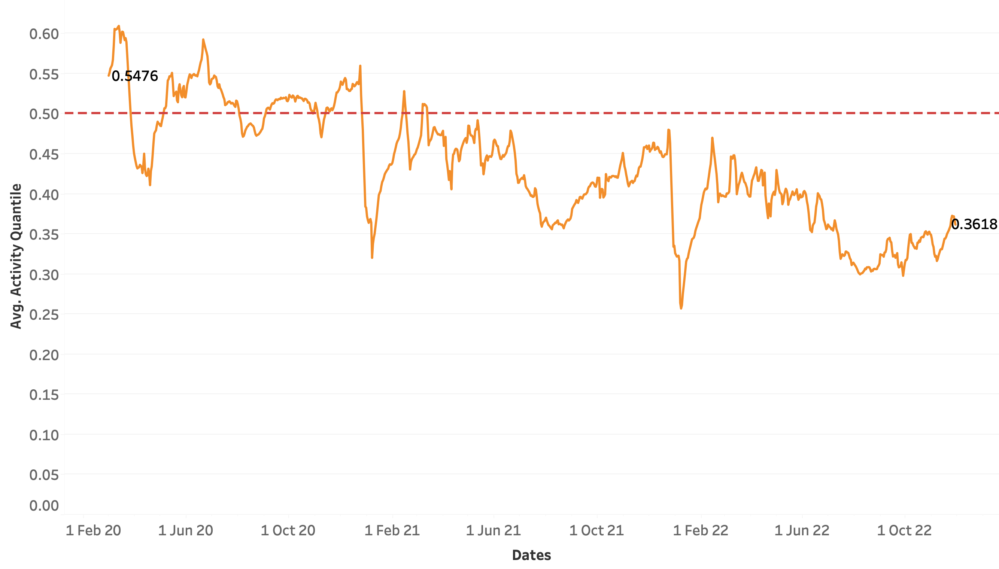

In [ ]:
df[(df['year']=="2022")].groupby('month')['activity_quantile'].mean().plot(kind='line')

In [ ]:
df[(df['year']=="2020")].groupby('month')['activity_quantile'].mean().plot(kind='line')

In [ ]:
df[(df['year']=="2021")].groupby('month')['activity_quantile'].mean().plot(kind='line')

In [ ]:
df.head()

In [ ]:
plt.figure(figsize=(12,6))
df1=df[df['year']=="2020"]
sns.lineplot(x=df1['weekday'],y=df1['activity_quantile'],hue=df1['month'])

In [ ]:
sns.lineplot(x=df['month'],y=df['activity_quantile'],hue=df['year'])

In [ ]:
df.head(2)

In [ ]:
df[df.duplicated()==True]

In [ ]:
df.groupby(['gadm_name','business_vertical'])['dates'].count()

In [ ]:
import matplotlib.pyplot as plt
import matplotlib.dates as mdates
from datetime import datetime, timedelta

In [ ]:
plt.figure(figsize=[10,8])

In [ ]:
df.head()

In [ ]:
df.info()

In [60]:
df['quarter']=pd.to_datetime(df['ds']).dt.quarter

In [61]:
df.head(2)

,gadm_name,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds,days_report,dates,weekday,week_no,year,month,quarter
0,Luxembourg,Retail,0.550204,116.600990,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1
1,Luxembourg,Home Services,0.641146,113.705543,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1


In [62]:
df[df.quarter==1][['month','year']].value_counts()

month  year
Jan    2021    73997
       2022    73997
Mar    2020    73997
       2021    73997
       2022    73997
Feb    2021    66836
       2022    66836
dtype: int64

In [63]:
df[df.quarter==2][['month','year']].value_counts()

month  year
May    2020    73997
       2021    73997
       2022    73997
Apr    2020    71610
       2021    71610
       2022    71610
Jun    2020    71610
       2021    71610
       2022    71610
dtype: int64

In [64]:
df[df.quarter==3][['month','year']].value_counts()

month  year
Jul    2020    73998
Aug    2020    73997
       2021    73997
       2022    73997
Jul    2021    73997
       2022    73997
Sep    2020    71610
       2021    71610
       2022    71610
dtype: int64

In [65]:
df[df.quarter==4]['month'].value_counts()

Oct    221991
Nov    212443
Dec    147994
Name: month, dtype: int64

In [67]:
df.loc[((df.quarter==1)&(df['year']=='2020')),'period']='Mar 1,2020'
df.loc[((df.quarter==1)&(df['year']=='2021')),'period']='Jan 1,2021'
df.loc[((df.quarter==1)&(df['year']=='2022')),'period']='Feb 1,2022'
df.loc[((df.quarter==2)&(df['year']=='2020')),'period']='May 1,2020'
df.loc[((df.quarter==2)&(df['year']=='2021')),'period']='Apr 1,2021'
df.loc[((df.quarter==2)&(df['year']=='2022')),'period']='Jun 1,2022'
df.loc[((df.quarter==3)&(df['year']=='2020')),'period']='Aug 1,2020'
df.loc[((df.quarter==3)&(df['year']=='2021')),'period']='Jul 1,2020'
df.loc[((df.quarter==3)&(df['year']=='2022')),'period']='Sep 1,2020'
df.loc[((df.quarter==4)&(df['year']=='2020')),'period']='Nov 1,2020'
df.loc[((df.quarter==4)&(df['year']=='2021')),'period']='Oct 1,2021'
df.loc[((df.quarter==4)&(df['year']=='2022')),'period']='Dec 1,2022'

In [68]:
df.period.value_counts()

Aug 1,2020    219605
Nov 1,2020    219604
Jul 1,2020    219604
Oct 1,2021    219604
Sep 1,2020    219604
May 1,2020    217217
Apr 1,2021    217217
Jun 1,2022    217217
Jan 1,2021    214830
Feb 1,2022    214830
Dec 1,2022    143220
Mar 1,2020     73997
Name: period, dtype: int64

In [69]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2396549 entries, 0 to 2396548
Data columns (total 14 columns):
 #   Column               Dtype          
---  ------               -----          
 0   gadm_name            object         
 1   business_vertical    object         
 2   activity_quantile    float64        
 3   activity_percentage  float64        
 4   crisis_ds            datetime64[ns] 
 5   ds                   datetime64[ns] 
 6   days_report          timedelta64[ns]
 7   dates                object         
 8   weekday              object         
 9   week_no              object         
 10  year                 object         
 11  month                object         
 12  quarter              int64          
 13  period               object         
dtypes: datetime64[ns](2), float64(2), int64(1), object(8), timedelta64[ns](1)
memory usage: 256.0+ MB


In [70]:
df['business_vertical'].unique()

array(['Retail', 'Home Services', 'Local Events', 'Manufacturing', 'All',
       'Public Good', 'Travel', 'Lifestyle Services',
       'Business & Utility Services', 'Professional Services',
       'Grocery & Convenience Stores', 'Restaurants'], dtype=object)

In [71]:
list(df['gadm_name'].unique())

['Luxembourg',
 'Czech Republic',
 'Germany',
 'Malta',
 'Virgin Islands, U.S.',
 'Anguilla',
 'Lesotho',
 'Gabon',
 'Kiribati',
 'South Africa',
 'Bahrain',
 'Slovenia',
 'Liberia',
 'Aruba',
 'Saint Pierre and Miquelon',
 'Sint Maarten',
 'Equatorial Guinea',
 'Saint Helena',
 'Rwanda',
 'Andorra',
 'Jersey',
 'Gibraltar',
 'Brunei',
 'Swaziland',
 'Tonga',
 'Zimbabwe',
 'Djibouti',
 'Northern Cyprus',
 'Benin',
 'Central African Republic',
 'Guatemala',
 'New Caledonia',
 'United Arab Emirates',
 'Latvia',
 'Niue',
 'Saint Vincent and the Grenadines',
 'Switzerland',
 'French Guiana',
 'Comoros',
 'Bulgaria',
 'Lithuania',
 'Laos',
 'Macedonia',
 'Turks and Caicos Islands',
 'American Samoa',
 'Niger',
 'Serbia',
 'Nepal',
 'Turkey',
 'Papua New Guinea',
 'Qatar',
 'Netherlands',
 'Hungary',
 'Curaçao',
 'Angola',
 'Kyrgyzstan',
 'Caspian Sea',
 'Ecuador',
 'Mozambique',
 'Armenia',
 'Gambia',
 'Trinidad and Tobago',
 'Akrotiri and Dhekelia',
 'Monaco',
 'Libya',
 'Guadeloupe',
 'Mi

In [72]:
df.head(2)

,gadm_name,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds,days_report,dates,weekday,week_no,year,month,quarter,period
0,Luxembourg,Retail,0.550204,116.600990,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1,"Mar 1,2020"
1,Luxembourg,Home Services,0.641146,113.705543,2020-03-01,2020-03-01,0 days,"Mar 1,2020",Sun,09,2020,Mar,1,"Mar 1,2020"


In [73]:
df.groupby(['gadm_name'])['activity_quantile'].var().sort_values(ascending=False)

gadm_name
Philippines         0.124586
Malaysia            0.085979
Indonesia           0.076122
Algeria             0.071911
Peru                0.069962
                      ...   
Vietnam             0.018481
Christmas Island    0.018327
Montserrat          0.017607
New Caledonia       0.016779
Eritrea             0.011271
Name: activity_quantile, Length: 220, dtype: float64

In [74]:
df.groupby(['gadm_name'])['activity_quantile'].var().sort_values(ascending=False)

gadm_name
Philippines         0.124586
Malaysia            0.085979
Indonesia           0.076122
Algeria             0.071911
Peru                0.069962
                      ...   
Vietnam             0.018481
Christmas Island    0.018327
Montserrat          0.017607
New Caledonia       0.016779
Eritrea             0.011271
Name: activity_quantile, Length: 220, dtype: float64

In [51]:
pd.set_option('display.max_rows',None)
df.groupby(['gadm_name','business_vertical'])['activity_quantile'].var().sort_values(ascending=False)

gadm_name                         business_vertical           
Malaysia                          Grocery & Convenience Stores    0.118975
Uganda                            Public Good                     0.117922
Philippines                       Restaurants                     0.115669
India                             Public Good                     0.108693
Malaysia                          Restaurants                     0.106419
Philippines                       Manufacturing                   0.105554
Albania                           Travel                          0.099438
Armenia                           Lifestyle Services              0.091322
Malaysia                          Manufacturing                   0.089287
Thailand                          Grocery & Convenience Stores    0.089176
Trinidad and Tobago               Lifestyle Services              0.088932
Singapore                         Restaurants                     0.088307
Germany                           Res

In [155]:
df.groupby(['business_vertical'])['activity_quantile'].var().sort_values(ascending=False)

business_vertical
Lifestyle Services              0.051320
Restaurants                     0.051023
Public Good                     0.045604
Grocery & Convenience Stores    0.043053
Manufacturing                   0.038253
Retail                          0.037317
Local Events                    0.036023
Travel                          0.035994
Home Services                   0.033665
All                             0.031884
Professional Services           0.025521
Business & Utility Services     0.024478
Name: activity_quantile, dtype: float64

In [195]:
df_new=df[(df['gadm_name']=='Philippines')
          |(df['gadm_name']=='Peru')|(df['gadm_name']=='Albania')|(df['gadm_name']=='Algeria')|(df['gadm_name']=='Fiji')|(df['gadm_name']=='Trinidad and Tobago')]

In [197]:
df_new.gadm_name.unique()

array(['Trinidad and Tobago', 'Albania', 'Algeria', 'Peru', 'Fiji',
       'Philippines'], dtype=object)

In [198]:
df1=df_new[df_new['business_vertical']=='Retail']
df2=df_new[df_new['business_vertical']=='Public Good']
df3=df_new[df_new['business_vertical']=='Restaurants']
df4=df_new[df_new['business_vertical']=='Grocery & Convenience Stores']
df5=df_new[df_new['business_vertical']=='Lifestyle Services']
df6=df_new[df_new['business_vertical']=='Local Events']

/var/folders/40/yskfqhxs5dn7xnsslpk_6pnc0000gn/T/ipykernel_1869/614136286.py:7: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df1['period'], y=df1['activity_quantile'], hue=df1['gadm_name'], ax=axes[0, 0], legend=False, linewidth=1, markersize=0,ci=None)
/var/folders/40/yskfqhxs5dn7xnsslpk_6pnc0000gn/T/ipykernel_1869/614136286.py:8: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df2['period'], y=df2['activity_quantile'], hue=df2['gadm_name'], ax=axes[0, 1], legend=False,ci=None)
/var/folders/40/yskfqhxs5dn7xnsslpk_6pnc0000gn/T/ipykernel_1869/614136286.py:9: FutureWarning: 

The `ci` parameter is deprecated. Use `errorbar=None` for the same effect.

  sns.lineplot(x=df3['period'], y=df3['activity_quantile'], hue=df3['gadm_name'], ax=axes[0, 2], legend=False,ci=None)
/var/folders/40/yskfqhxs5dn7xnsslpk_6pnc0000gn/T/ipykernel_1869/614136286.py:10: FutureWarning: 


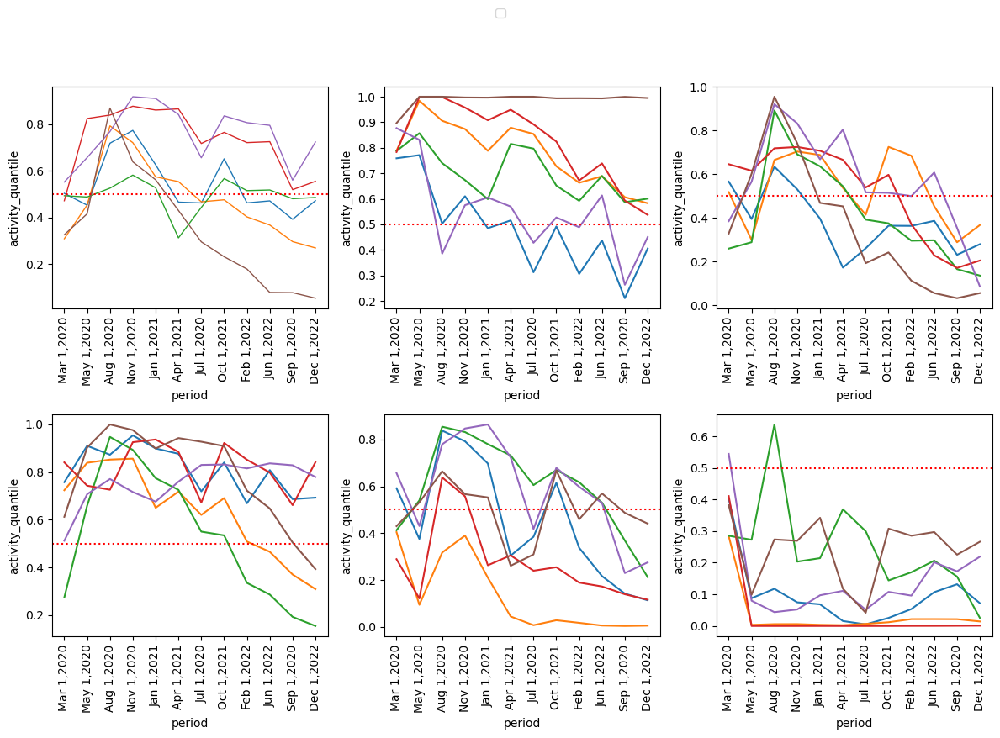

In [258]:
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

for ax in axes.flatten():
    plt.sca(ax)  # Set the current axis
    plt.xticks(rotation=90)  # Rotate x-axis tick labels

sns.lineplot(x=df1['period'], y=df1['activity_quantile'], hue=df1['gadm_name'], ax=axes[0, 0], legend=False, linewidth=1, markersize=0,ci=None)
sns.lineplot(x=df2['period'], y=df2['activity_quantile'], hue=df2['gadm_name'], ax=axes[0, 1], legend=False,ci=None)
sns.lineplot(x=df3['period'], y=df3['activity_quantile'], hue=df3['gadm_name'], ax=axes[0, 2], legend=False,ci=None)
sns.lineplot(x=df4['period'], y=df4['activity_quantile'], hue=df4['gadm_name'], ax=axes[1, 0], legend=False,ci=None)
sns.lineplot(x=df5['period'], y=df5['activity_quantile'], hue=df5['gadm_name'], ax=axes[1, 1], legend=False,ci=None)
sns.lineplot(x=df6['period'], y=df6['activity_quantile'], hue=df6['gadm_name'], ax=axes[1, 2], legend=False,ci=None)

for ax in axes.flatten():
    ax.axhline(y=0.5, linestyle='dotted', color='red')
    
handles, labels = ax.get_legend_handles_labels()
fig.legend(handles, labels, loc='upper center', bbox_to_anchor=(0.5, 1.1))

plt.tight_layout()
plt.show()


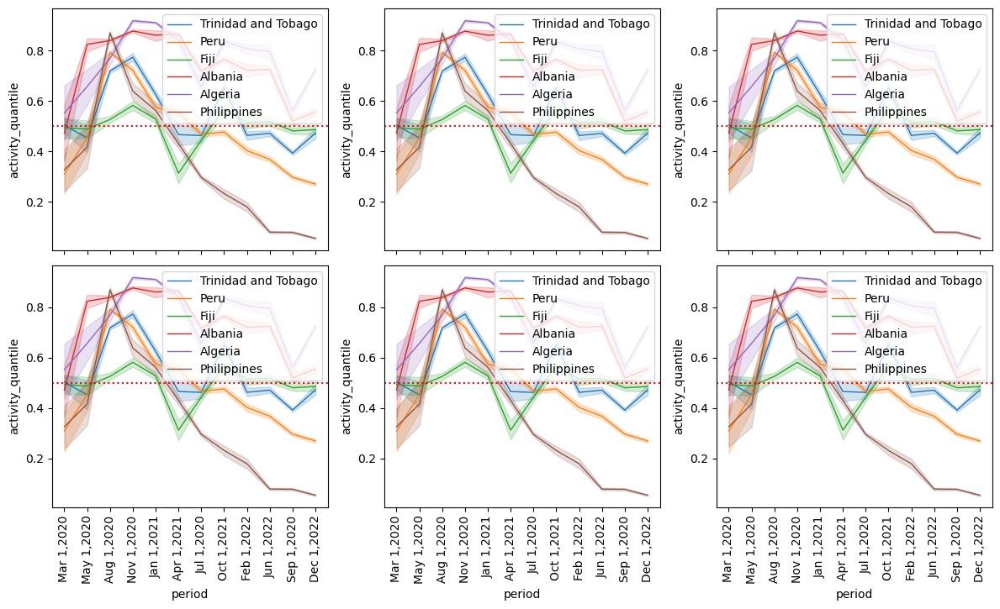

In [252]:
import matplotlib.pyplot as plt
import seaborn as sns

# Create a list of unique gadm_names for the legend
unique_gadm_names = df1['gadm_name'].unique()

fig, axes = plt.subplots(2, 3, figsize=(12, 8), sharex=True)

for ax in axes.flatten():
    plt.sca(ax)  # Set the current axis
    plt.xticks(rotation=90)  # Rotate x-axis tick labels

    for gadm_name in unique_gadm_names:
        data = df1[df1['gadm_name'] == gadm_name]
        sns.lineplot(x=data['period'], y=data['activity_quantile'], label=gadm_name, linewidth=1, markersize=0)

for ax in axes.flatten():
    ax.axhline(y=0.5, linestyle='dotted', color='red')
    ax.legend(loc='upper right', bbox_to_anchor=(1, 1))

plt.tight_layout()
plt.subplots_adjust(top=0.9)  # Adjust the top spacing to make room for the common legend
plt.show()


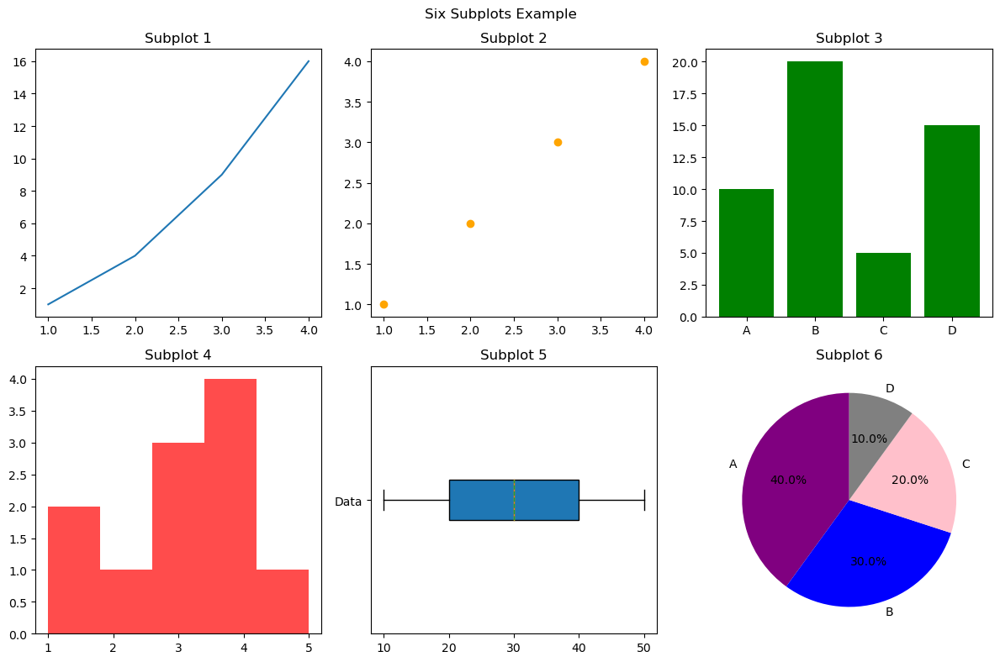

In [216]:
import matplotlib.pyplot as plt

# Create a 2x3 grid of subplots
fig, axes = plt.subplots(2, 3, figsize=(12, 8))

# You can access each subplot using indexing, e.g., axes[0, 0] is the top-left subplot

# Plot something in each subplot
axes[0, 0].plot([1, 2, 3, 4], [1, 4, 9, 16], label='Subplot 1')
axes[0, 1].scatter([1, 2, 3, 4], [1, 2, 3, 4], label='Subplot 2', color='orange')
axes[0, 2].bar(['A', 'B', 'C', 'D'], [10, 20, 5, 15], label='Subplot 3', color='green')
axes[1, 0].hist([1, 1, 2, 3, 3, 3, 4, 4, 4, 4, 5], bins=5, label='Subplot 4', color='red', alpha=0.7)
axes[1, 1].boxplot([10, 20, 30, 40, 50], labels=['Data'], vert=False, showmeans=True, meanline=True, patch_artist=True)
axes[1, 2].pie([40, 30, 20, 10], labels=['A', 'B', 'C', 'D'], autopct='%1.1f%%', startangle=90, colors=['purple', 'blue', 'pink', 'gray'])

# Add titles to subplots
axes[0, 0].set_title('Subplot 1')
axes[0, 1].set_title('Subplot 2')
axes[0, 2].set_title('Subplot 3')
axes[1, 0].set_title('Subplot 4')
axes[1, 1].set_title('Subplot 5')
axes[1, 2].set_title('Subplot 6')

# Add a common title for the entire figure
fig.suptitle('Six Subplots Example')

# Adjust spacing between subplots
plt.tight_layout()

# Display the figure
plt.show()


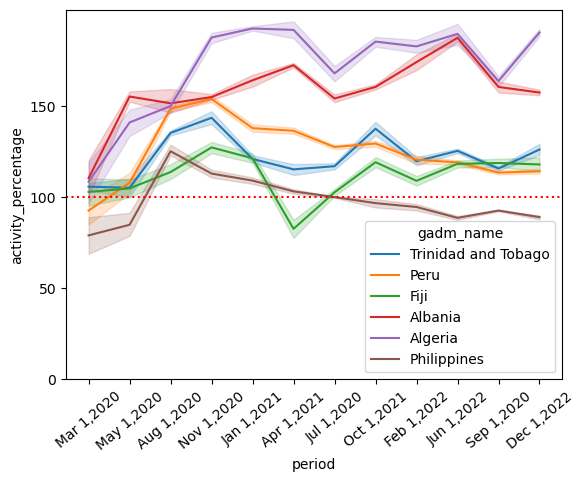

In [260]:
x=df1['period']
sns.lineplot(x=df1['period'],y=df1['activity_percentage'],hue=df1['gadm_name'])
custom_ticks = [0, 50, 100, 150]
plt.yticks(custom_ticks)
plt.axhline(y=100, linestyle='dotted', color='red')
plt.xticks(rotation=40)
plt.show()

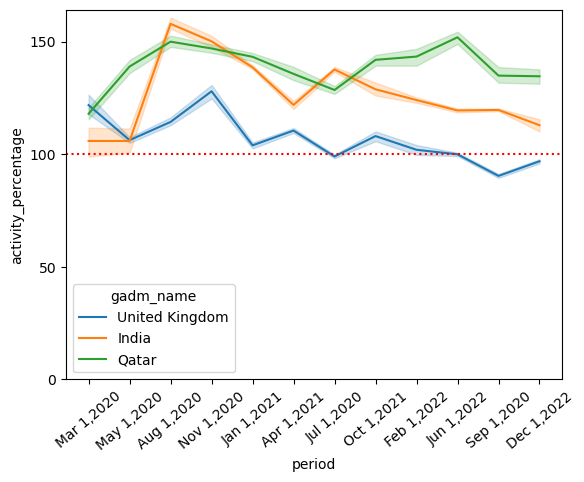

In [159]:
x=df1['period']
sns.lineplot(x=df1['period'],y=df1['activity_percentage'],hue=df1['gadm_name'])
custom_ticks = [0, 50, 100, 150]
plt.yticks(custom_ticks)
plt.axhline(y=100, linestyle='dotted', color='red')
plt.xticks(rotation=40)
plt.show()

In [160]:
countries=list(df['gadm_name'].unique())

In [161]:
developed_countries = [
    'Luxembourg', 'Czech Republic', 'Germany', 'Malta', 'Virgin Islands, U.S.', 'Slovenia', 
    'Aruba', 'Andorra', 'Jersey', 'Gibraltar', 'Switzerland', 'Netherlands', 'France', 
    'Iceland', 'Italy', 'Spain', 'Sweden', 'United Kingdom', 'Austria', 'Norway', 'United States', 
    'Canada'
]

df['Development Status'] = 'Developing'  # Default to "Developing"
df.loc[df['gadm_name'].isin(developed_countries), 'Development Status'] = 'Developed'


In [78]:
#df=df.drop(['Continent','development_status','Development_Status'],axis=1)

In [ ]:
df.head()

In [162]:
df['Development Status'].value_counts(normalize=True)

Developing    0.889401
Developed     0.110599
Name: Development Status, dtype: float64

In [59]:
df.groupby('Development Status')['activity_quantile'].mean()

Development Status
Developed     0.414804
Developing    0.435702
Name: activity_quantile, dtype: float64

In [60]:
df[df['gadm_name']=='Philippines']['activity_quantile'].mean()

0.37409424060888724

In [ ]:
df[df['gadm_name']=='Algeria']['activity_quantile'].mean()

In [163]:
dff=pd.read_csv('Continents.csv')
dff.head()

,Continent,Country
0,Africa,Algeria
1,Africa,Angola
2,Africa,Benin
3,Africa,Botswana
4,Africa,Burkina


In [165]:
import pandas as pd

data = ['Czech Republic', 'Virgin Islands, U.S.', 'Anguilla', 'Aruba', 'Saint Pierre and Miquelon', 
        'Sint Maarten', 'Saint Helena', 'Jersey', 'Gibraltar', 'Northern Cyprus', 'New Caledonia', 
        'Niue', 'French Guiana', 'Turks and Caicos Islands', 'American Samoa', 'Curaçao', 'Caspian Sea', 
        'Akrotiri and Dhekelia', 'Guadeloupe', 'Taiwan', 'Bermuda', 'Saint-Martin', 'Åland', "Côte d'Ivoire", 
        'Northern Mariana Islands', 'Guam', 'British Virgin Islands', 'Guernsey', 'Martinique', 'Burkina Faso', 
        'São Tomé and Príncipe', 'Timor-Leste', 'Mayotte', 'Isle of Man', 'Macao', 'Cayman Islands', 'Faroe Islands', 
        'Democratic Republic of the Congo', 'Hong Kong', 'Montserrat', 'Bonaire, Sint Eustatius and Saba', 'Svalbard and Jan Mayen', 
        'Cook Islands', 'French Polynesia', 'Norfolk Island', 'Puerto Rico', 'Christmas Island', 'South Korea', 
        'Falkland Islands', 'Greenland', 'Reunion', 'Saint-Barthélemy', 'United States', 'Republic of Congo']

# Define a dictionary mapping countries to their continents
country_to_continent = {
    'Czech Republic': 'Europe', 'Virgin Islands, U.S.': 'North America', 'Anguilla': 'North America',
    'Aruba': 'North America', 'Saint Pierre and Miquelon': 'North America', 'Sint Maarten': 'North America',
    'Saint Helena': 'Africa', 'Jersey': 'Europe', 'Gibraltar': 'Europe', 'Northern Cyprus': 'Europe', 
    'New Caledonia': 'Oceania', 'Niue': 'Oceania', 'French Guiana': 'South America', 
    'Turks and Caicos Islands': 'North America', 'American Samoa': 'Oceania', 'Curaçao': 'North America',
    'Caspian Sea': 'Asia', 'Akrotiri and Dhekelia': 'Europe', 'Guadeloupe': 'North America', 
    'Taiwan': 'Asia', 'Bermuda': 'North America', 'Saint-Martin': 'North America', 'Åland': 'Europe', 
    "Côte d'Ivoire": 'Africa', 'Northern Mariana Islands': 'Oceania', 'Guam': 'Oceania', 
    'British Virgin Islands': 'North America', 'Guernsey': 'Europe', 'Martinique': 'North America', 
    'Burkina Faso': 'Africa', 'São Tomé and Príncipe': 'Africa', 'Timor-Leste': 'Asia', 
    'Mayotte': 'Africa', 'Isle of Man': 'Europe', 'Macao': 'Asia', 'Cayman Islands': 'North America', 
    'Faroe Islands': 'Europe', 'Democratic Republic of the Congo': 'Africa', 'Hong Kong': 'Asia', 
    'Montserrat': 'North America', 'Bonaire, Sint Eustatius and Saba': 'North America', 
    'Svalbard and Jan Mayen': 'Europe', 'Cook Islands': 'Oceania', 'French Polynesia': 'Oceania', 
    'Norfolk Island': 'Oceania', 'Puerto Rico': 'North America', 'Christmas Island': 'Asia', 
    'South Korea': 'Asia', 'Falkland Islands': 'South America', 'Greenland': 'North America', 
    'Reunion': 'Africa', 'Saint-Barthélemy': 'North America', 'United States': 'North America', 
    'Republic of Congo': 'Africa'
}

# Create a DataFrame
data = pd.DataFrame({'Country': data})
data['Continent'] = data['Country'].map(country_to_continent)
#print(df)


In [182]:
c=list(data)

In [183]:

data[[c[0], c[1]]] = data[[c[1], c[0]]]

In [185]:
data.shape

(54, 2)

In [187]:
dff.shape

(194, 2)

In [190]:
dff=pd.concat([dff,data])

In [191]:
dff=dff.rename(columns={'Country':'gadm_name'})
dff.head(2)

,Continent,gadm_name
0,Africa,Algeria
1,Africa,Angola


In [197]:
data=pd.merge(df,dff, how='left', on=['gadm_name'])

In [198]:
data.shape

(2396549, 17)

In [199]:
df.shape

(2396549, 16)

In [203]:
data[data['Continent'].isnull()]

,gadm_name,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds,days_report,dates,weekday,year,week_no,month,week_end,quarter,period,Development Status,Continent


In [205]:
data['Continent'].unique()

array(['Europe', 'North America', 'Africa', 'Oceania', 'Asia',
       'South America'], dtype=object)

In [207]:
data.groupby('Continent')['activity_quantile'].mean()

Continent
Africa           0.444769
Asia             0.402022
Europe           0.427294
North America    0.435330
Oceania          0.437375
South America    0.498527
Name: activity_quantile, dtype: float64

In [210]:
data.to_csv('course_work.csv',index=False)

In [5]:
course_work=pd.read_csv('course_work.csv')
course_work.head()

,gadm_name,business_vertical,activity_quantile,activity_percentage,crisis_ds,ds,days_report,dates,weekday,week_no,year,month,week_end,quarter,period,Development Status,Continent
0,Luxembourg,Retail,0.550204,116.600990,2020-03-01,2020-03-01,0 days,2020-03-01,Sun,9,2020,Mar,Yes,1,"Mar 1,2020",Developed,Europe
1,Luxembourg,Home Services,0.641146,113.705543,2020-03-01,2020-03-01,0 days,2020-03-01,Sun,9,2020,Mar,Yes,1,"Mar 1,2020",Developed,Europe
2,Luxembourg,Local Events,0.663123,103.226699,2020-03-01,2020-03-01,0 days,2020-03-01,Sun,9,2020,Mar,Yes,1,"Mar 1,2020",Developed,Europe
3,Luxembourg,Manufacturing,0.504707,103.525641,2020-03-01,2020-03-01,0 days,2020-03-01,Sun,9,2020,Mar,Yes,1,"Mar 1,2020",Developed,Europe
4,Czech Republic,All,0.583032,108.645654,2020-03-01,2020-03-01,0 days,2020-03-01,Sun,9,2020,Mar,Yes,1,"Mar 1,2020",Developed,NaN


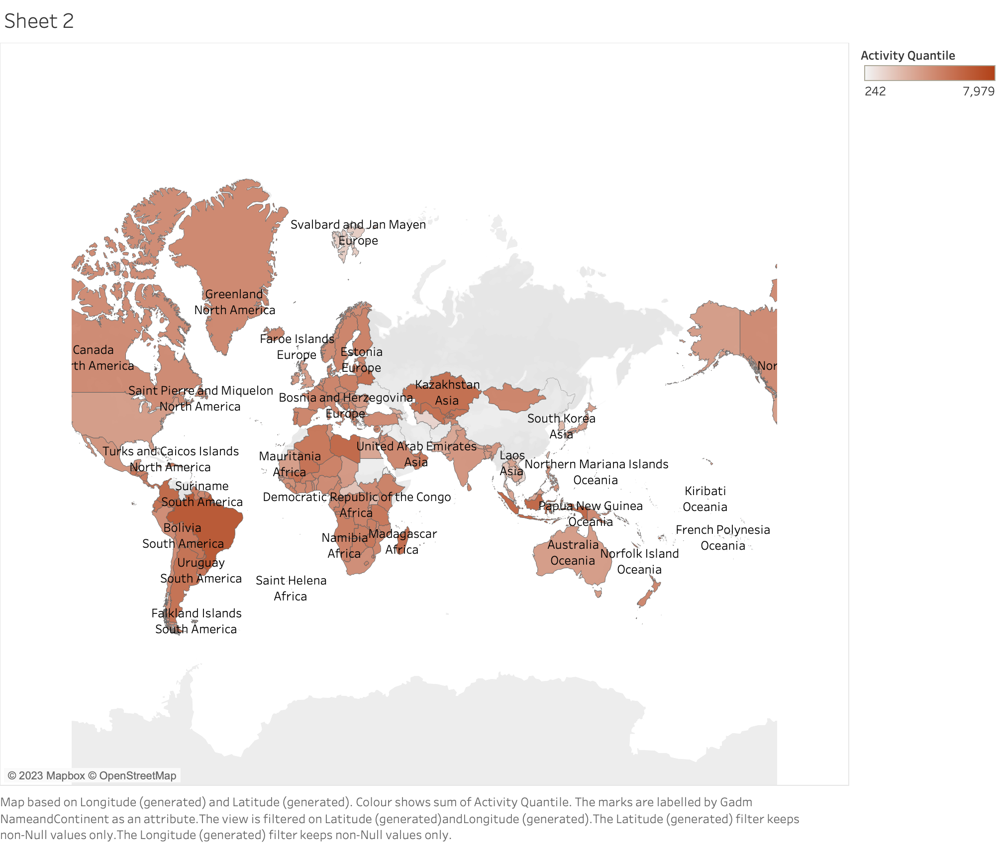

In [185]:
course_work.groupby(['Continent','gadm_name','business_vertical'])['activity_quantile'].mean().sort_values()

Continent      gadm_name                         business_vertical           
Asia           Thailand                          Local Events                    0.009556
               Philippines                       Local Events                    0.012873
Europe         Georgia                           Local Events                    0.018824
South America  Peru                              Local Events                    0.019188
Africa         Uganda                            Local Events                    0.019891
Asia           Philippines                       Travel                          0.021472
               Nepal                             Local Events                    0.028797
               Vietnam                           Travel                          0.029520
Europe         Georgia                           Travel                          0.029651
Asia           Vietnam                           Local Events                    0.030262
               Malaysi

In [101]:
course_work.groupby(['Continent','gadm_name','business_vertical'])['activity_quantile'].mean().sort_values(ascending=False)

Continent      gadm_name                         business_vertical           
Asia           Philippines                       Public Good                     0.994143
               Turkmenistan                      Retail                          0.960425
North America  Guatemala                         Public Good                     0.929572
South America  Colombia                          Public Good                     0.886293
Europe         Belarus                           Lifestyle Services              0.883395
Asia           Bahrain                           Grocery & Convenience Stores    0.878918
Africa         Kenya                             Public Good                     0.866207
               Zambia                            Public Good                     0.862399
South America  Guyana                            Public Good                     0.841213
               Peru                              Public Good                     0.832158
North America  Panama 

In [70]:

course_work.groupby(['gadm_name'])['activity_quantile'].var().sort_values()

gadm_name
Eritrea                             0.011271
New Caledonia                       0.016779
Montserrat                          0.017607
Christmas Island                    0.018327
Vietnam                             0.018481
Niue                                0.018573
Aruba                               0.019967
American Samoa                      0.020262
Vatican City                        0.020392
Zimbabwe                            0.020960
Greenland                           0.021280
Micronesia                          0.021385
Andorra                             0.021558
Central African Republic            0.021568
Grenada                             0.021858
Saint Helena                        0.021942
Estonia                             0.022378
Poland                              0.022786
Lithuania                           0.022857
Kiribati                            0.023083
Malawi                              0.023086
Côte d'Ivoire                       0.023301


In [ ]:
df_new=df[(df['gadm_name']=='India')|(df['gadm_name']=='Qatar')|(df['gadm_name']=='United Kingdom')]
df1=df_new[df_new['business_vertical']=='Lifestyle Services']
df2=df_new[df_new['business_vertical']=='Public Good']
df3=df_new[df_new['business_vertical']=='Restaurants']
df3=df_new[df_new['business_vertical']=='Restaurants']
df3=df_new[df_new['business_vertical']=='Restaurants']



sns.lineplot(x=df1['period'],y=df1['activity_quantile'],hue=df1['gadm_name'])
plt.axhline(y=0.5, linestyle='dotted', color='red')
plt.xticks(rotation=90)
plt.show()

In [105]:
string=pd.read_csv('string.csv')
string.head()

,_id,Entity,Code,Date,stringency_index
0,1,Afghanistan,AFG,2020-01-01T00:00:00,0.0
1,2,Afghanistan,AFG,2020-01-02T00:00:00,0.0
2,3,Afghanistan,AFG,2020-01-03T00:00:00,0.0
3,4,Afghanistan,AFG,2020-01-04T00:00:00,0.0
4,5,Afghanistan,AFG,2020-01-05T00:00:00,0.0


<Axes: xlabel='row_0'>

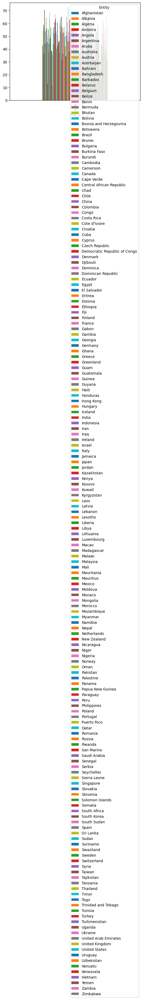

In [117]:
pd.crosstab(columns=string['Entity'],index=['Date'],values=string['stringency_index'],aggfunc='mean').plot(kind='bar')

In [27]:
string2=pd.read_csv('stringency_index_avg.csv')
string2.head()

,Unnamed: 0,country_code,country_name,region_code,region_name,jurisdiction,01Jan2020,02Jan2020,03Jan2020,04Jan2020,...,11Feb2023,12Feb2023,13Feb2023,14Feb2023,15Feb2023,16Feb2023,17Feb2023,18Feb2023,19Feb2023,20Feb2023
0,1,ABW,Aruba,NaN,NaN,NAT_TOTAL,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2,AFG,Afghanistan,NaN,NaN,NAT_TOTAL,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,3,AGO,Angola,NaN,NaN,NAT_TOTAL,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,4,ALB,Albania,NaN,NaN,NAT_TOTAL,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,5,AND,Andorra,NaN,NaN,NAT_TOTAL,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [53]:
string2[string2['country_name']=='Thailand']

,Unnamed: 0,country_code,country_name,region_code,region_name,jurisdiction,01Jan2020,02Jan2020,03Jan2020,04Jan2020,...,11Feb2023,12Feb2023,13Feb2023,14Feb2023,15Feb2023,16Feb2023,17Feb2023,18Feb2023,19Feb2023,20Feb2023
189,190,THA,Thailand,NaN,NaN,NAT_TOTAL,0.0,0.0,0.0,0.0,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:

sns.lineplot(x)

In [28]:
string3=string2.T

In [69]:
string3.iloc[:,15]

Unnamed: 0                     16
country_code                  AUS
country_name            Australia
region_code                AUS_WA
region_name     Western Australia
jurisdiction          STATE_TOTAL
01Jan2020                     NaN
02Jan2020                     NaN
03Jan2020                     NaN
04Jan2020                     NaN
05Jan2020                     NaN
06Jan2020                     NaN
07Jan2020                     NaN
08Jan2020                     NaN
09Jan2020                     NaN
10Jan2020                     NaN
11Jan2020                     NaN
12Jan2020                     NaN
13Jan2020                     NaN
14Jan2020                     NaN
15Jan2020                     NaN
16Jan2020                     NaN
17Jan2020                     NaN
18Jan2020                     NaN
19Jan2020                     NaN
20Jan2020                     NaN
21Jan2020                     NaN
22Jan2020                     0.0
23Jan2020                     0.0
24Jan2020     

<Axes: >

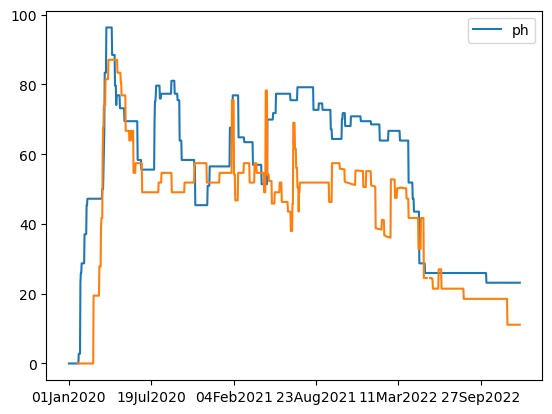

In [68]:
#string3.iloc[6:,157].plot()
string3.iloc[6:,257].plot(kind='line') # vietnam
plt.legend(['ph','gh']) #phili
string3.iloc[6:,15].plot()

In [65]:
string3.iloc[:,15]

Unnamed: 0                     16
country_code                  AUS
country_name            Australia
region_code                AUS_WA
region_name     Western Australia
jurisdiction          STATE_TOTAL
01Jan2020                     NaN
02Jan2020                     NaN
03Jan2020                     NaN
04Jan2020                     NaN
05Jan2020                     NaN
06Jan2020                     NaN
07Jan2020                     NaN
08Jan2020                     NaN
09Jan2020                     NaN
10Jan2020                     NaN
11Jan2020                     NaN
12Jan2020                     NaN
13Jan2020                     NaN
14Jan2020                     NaN
15Jan2020                     NaN
16Jan2020                     NaN
17Jan2020                     NaN
18Jan2020                     NaN
19Jan2020                     NaN
20Jan2020                     NaN
21Jan2020                     NaN
22Jan2020                     0.0
23Jan2020                     0.0
24Jan2020     

In [1]:

course_work.groupby(['gadm_name'])['activity_quantile'].var().sort_values(ascending=False)

NameError: name 'course_work' is not defined

In [22]:
pd.set_option('display.max_rows',None)
course_work.groupby('gadm_name')['activity_quantile'].mean().sort_values(ascending=False)

gadm_name
Turkmenistan                        0.698650
Brazil                              0.662301
Bahrain                             0.598550
Albania                             0.590401
Libya                               0.577110
Indonesia                           0.576892
Colombia                            0.571877
South Sudan                         0.552398
Panama                              0.549303
Niger                               0.548101
Madagascar                          0.547636
Uzbekistan                          0.545669
Kazakhstan                          0.545579
Belarus                             0.541237
Grenada                             0.531787
Ecuador                             0.531629
Mali                                0.530049
Argentina                           0.529531
Fiji                                0.528568
Kyrgyzstan                          0.527108
Paraguay                            0.524958
Guatemala                           0.523574


In [29]:
string3

,0,1,2,3,4,5,6,7,8,9,...,253,254,255,256,257,258,259,260,261,262
Unnamed: 0,1,2,3,4,5,6,7,8,9,10,...,254,255,256,257,258,259,260,261,262,263
country_code,ABW,AFG,AGO,ALB,AND,ARE,ARG,AUS,AUS,AUS,...,USA,UZB,VEN,VIR,VNM,VUT,YEM,ZAF,ZMB,ZWE
country_name,Aruba,Afghanistan,Angola,Albania,Andorra,United Arab Emirates,Argentina,Australia,Australia,Australia,...,United States,Uzbekistan,Venezuela,United States Virgin Islands,Vietnam,Vanuatu,Yemen,South Africa,Zambia,Zimbabwe
region_code,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AUS_ACT,AUS_NSW,...,US_WY,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
region_name,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Australian Capital Territory,New South Wales,...,Wyoming,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
jurisdiction,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,STATE_TOTAL,STATE_TOTAL,...,STATE_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL,NAT_TOTAL
01Jan2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
02Jan2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
03Jan2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
04Jan2020,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,NaN,NaN,...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<Axes: >

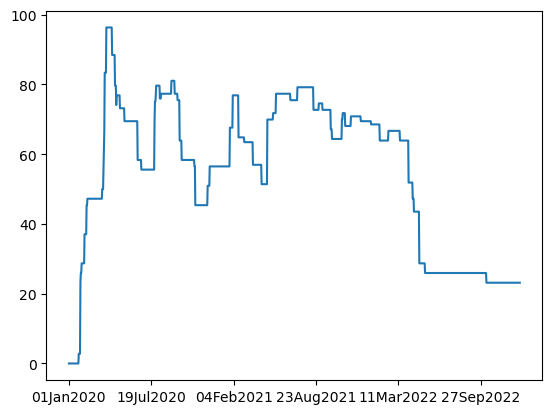

In [67]:
#string3.iloc[6:,31].plot(kind='line')
string3.iloc[6:,257].plot(kind='line') # vietnam
#string3.iloc[6:,189].plot(kind='line') # thailand

In [49]:
string3.iloc[0:,97]

Unnamed: 0             98
country_code          HKG
country_name    Hong Kong
region_code           NaN
region_name           NaN
jurisdiction    NAT_TOTAL
01Jan2020           13.89
02Jan2020           13.89
03Jan2020           13.89
04Jan2020           13.89
05Jan2020           13.89
06Jan2020           13.89
07Jan2020           13.89
08Jan2020           13.89
09Jan2020           13.89
10Jan2020           13.89
11Jan2020           13.89
12Jan2020           13.89
13Jan2020           13.89
14Jan2020           13.89
15Jan2020           13.89
16Jan2020           13.89
17Jan2020           13.89
18Jan2020           13.89
19Jan2020           13.89
20Jan2020           13.89
21Jan2020           13.89
22Jan2020           13.89
23Jan2020           13.89
24Jan2020           13.89
25Jan2020            25.0
26Jan2020           36.11
27Jan2020           41.67
28Jan2020           45.37
29Jan2020           49.07
30Jan2020           49.07
31Jan2020           49.07
01Feb2020           49.07
02Feb2020   

In [47]:
string2['30Jan2020']

0       0.00
1       0.00
2       0.00
3       0.00
4       0.00
5       2.78
6      11.11
7       5.56
8       0.00
9       0.00
10      0.00
11      0.00
12      0.00
13      0.00
14      0.00
15      0.00
16      0.00
17      2.78
18      0.00
19      5.56
20      0.00
21      0.00
22     13.89
23      0.00
24     11.11
25     13.89
26      0.00
27      0.00
28      0.00
29     11.11
30      0.00
31      5.56
32     16.67
33     19.44
34     13.89
35     13.89
36      0.00
37      2.78
38       NaN
39       NaN
40       NaN
41       NaN
42       NaN
43       NaN
44       NaN
45       NaN
46       NaN
47       NaN
48       NaN
49       NaN
50       NaN
51      0.00
52      0.00
53     69.91
54      0.00
55      0.00
56      0.00
57      0.00
58      8.33
59       NaN
60      0.00
61      0.00
62     11.11
63      0.00
64     16.67
65      5.56
66      0.00
67      0.00
68      0.00
69      0.00
70      0.00
71      5.56
72      0.00
73       NaN
74      0.00
75      0.00
76      2.78

In [ ]:
course_work.groupby(['business_vertical'])['activity_quantile'].mean().sort_values(ascending=False).plot(kind='bar')

(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10]),
 [Text(0, 0, 'Retail'),
  Text(1, 0, 'Home Services'),
  Text(2, 0, 'Local Events'),
  Text(3, 0, 'Manufacturing'),
  Text(4, 0, 'Public Good'),
  Text(5, 0, 'Travel'),
  Text(6, 0, 'Lifestyle Services'),
  Text(7, 0, 'Business & Utility Services'),
  Text(8, 0, 'Professional Services'),
  Text(9, 0, 'Grocery & Convenience Stores'),
  Text(10, 0, 'Restaurants')])

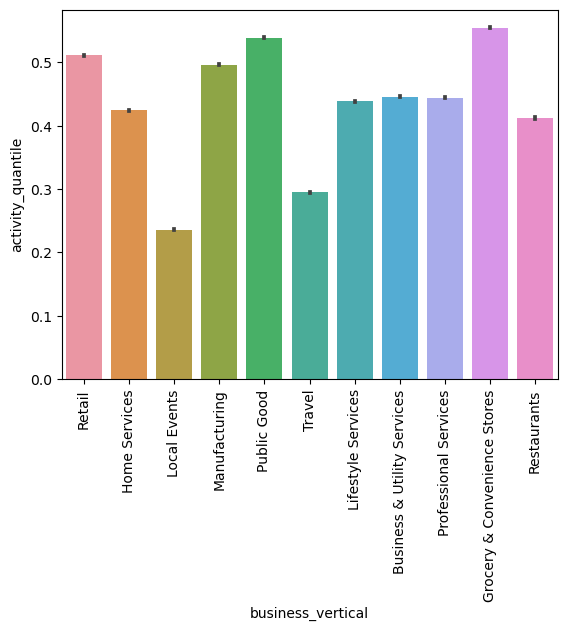

In [62]:
fy=course_work[~(course_work['business_vertical']=='All')]
sns.barplot(x=fy['business_vertical'],y=fy['activity_quantile'])
plt.xticks(rotation=90)

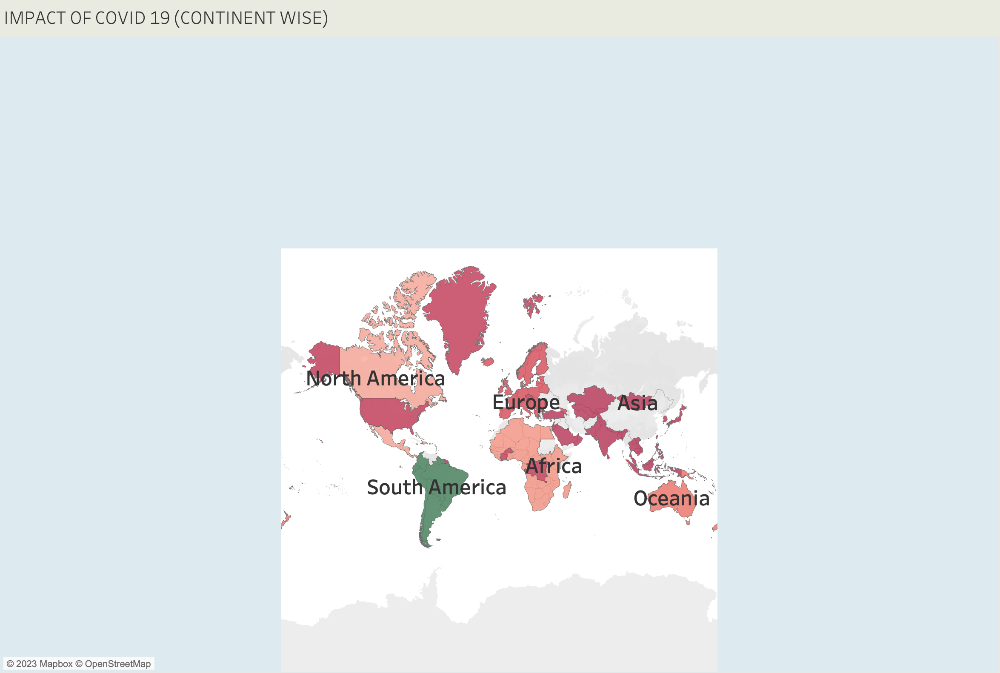

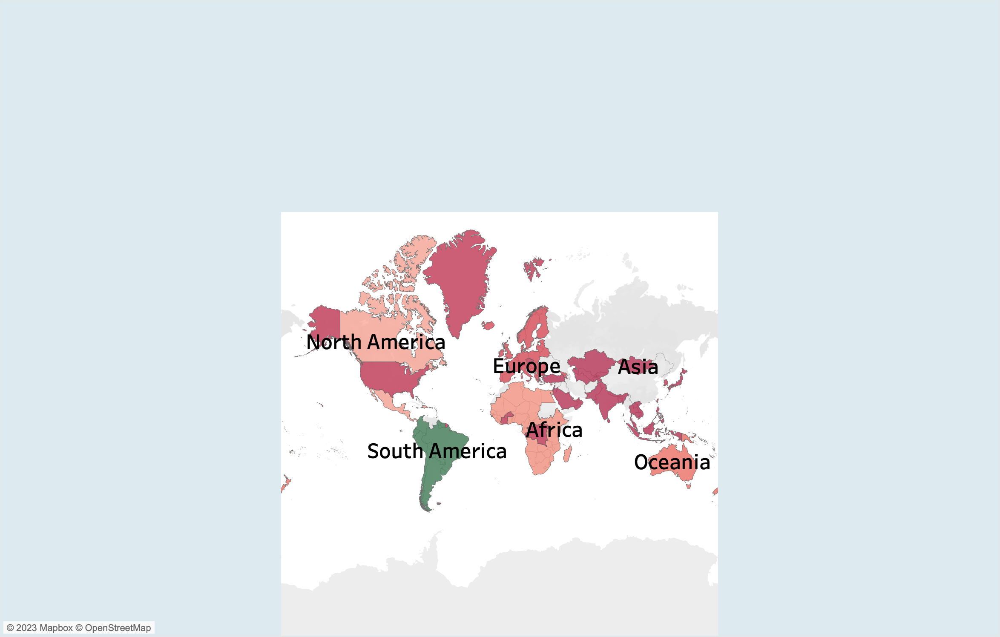

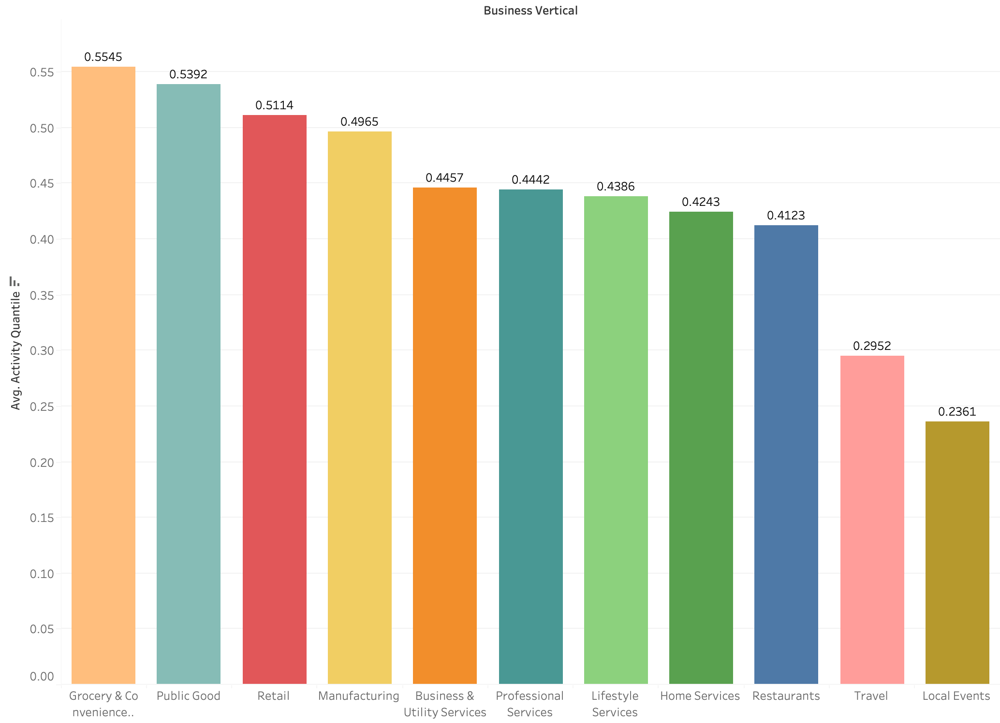

In [77]:

course_work.groupby(['Continent'])['activity_quantile'].mean().sort_values()

Continent
Asia             0.414142
Europe           0.426054
Oceania          0.435733
Africa           0.444822
North America    0.449801
South America    0.502960
Name: activity_quantile, dtype: float64

In [81]:
course_work[course_work['Continent']=='North America']['gadm_name'].unique()


array(['Guatemala', 'Saint Vincent and the Grenadines',
       'Trinidad and Tobago', 'Saint Lucia', 'Jamaica',
       'Saint Kitts and Nevis', 'El Salvador', 'Haiti', 'Belize',
       'Honduras', 'Nicaragua', 'Grenada', 'Dominica', 'Panama',
       'Costa Rica', 'Barbados', 'Antigua and Barbuda', 'Mexico',
       'Bahamas', 'Dominican Republic', 'Canada'], dtype=object)

In [76]:
d.groupby('gadm_name')['activity_quantile'].mean()

gadm_name
Bahrain                 0.598550
Bangladesh              0.353377
Bhutan                  0.464234
Brunei                  0.512348
Cambodia                0.314779
India                   0.365817
Indonesia               0.576892
Israel                  0.437991
Japan                   0.321536
Jordan                  0.432180
Kazakhstan              0.545579
Kuwait                  0.483478
Kyrgyzstan              0.527108
Laos                    0.317423
Lebanon                 0.325029
Malaysia                0.304239
Maldives                0.470541
Mongolia                0.437204
Nepal                   0.286454
Oman                    0.504273
Pakistan                0.288240
Philippines             0.374094
Qatar                   0.476052
Saudi Arabia            0.429236
Singapore               0.415866
Sri Lanka               0.436119
Tajikistan              0.470489
Thailand                0.184535
Turkey                  0.411214
Turkmenistan            0.698650


In [80]:
course_work.groupby(['gadm_name'])['activity_quantile'].var().sort_values()

gadm_name
Eritrea                             0.011271
New Caledonia                       0.016779
Montserrat                          0.017607
Christmas Island                    0.018327
Vietnam                             0.018481
Niue                                0.018573
Aruba                               0.019967
American Samoa                      0.020262
Vatican City                        0.020392
Zimbabwe                            0.020960
Greenland                           0.021280
Micronesia                          0.021385
Andorra                             0.021558
Central African Republic            0.021568
Grenada                             0.021858
Saint Helena                        0.021942
Estonia                             0.022378
Poland                              0.022786
Lithuania                           0.022857
Kiribati                            0.023083
Malawi                              0.023086
Côte d'Ivoire                       0.023301


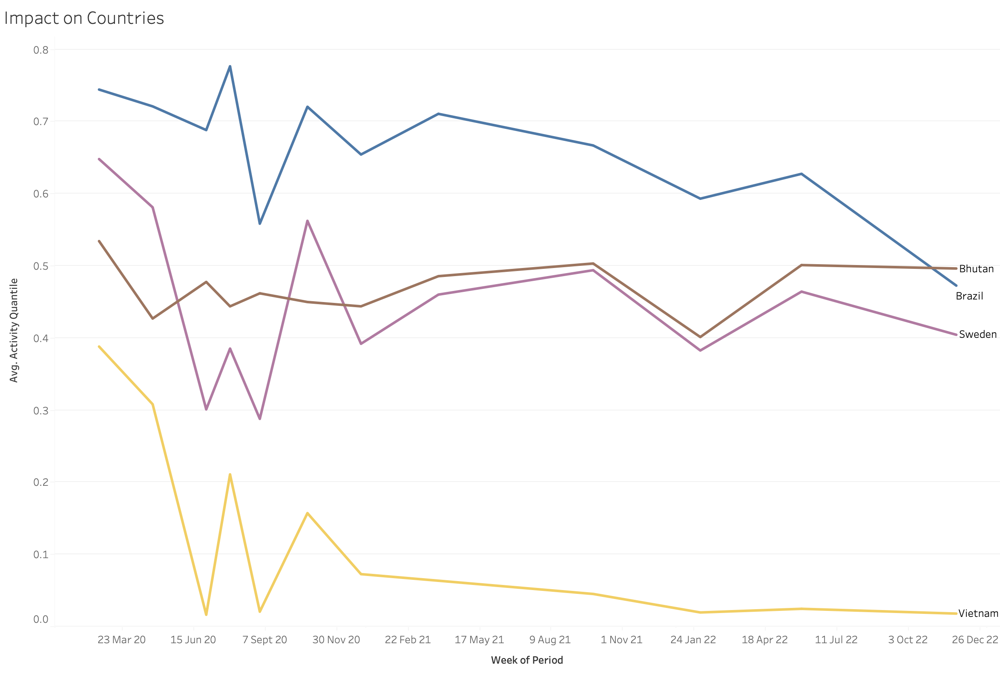

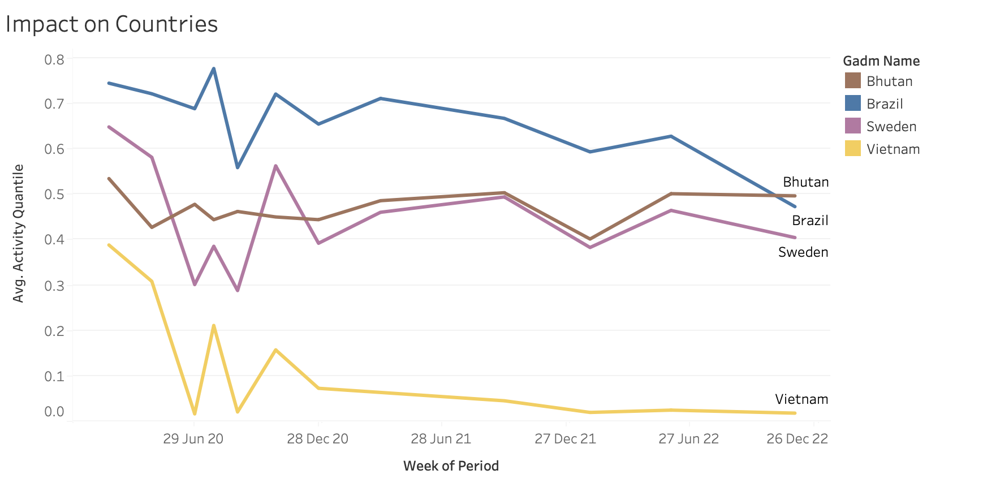

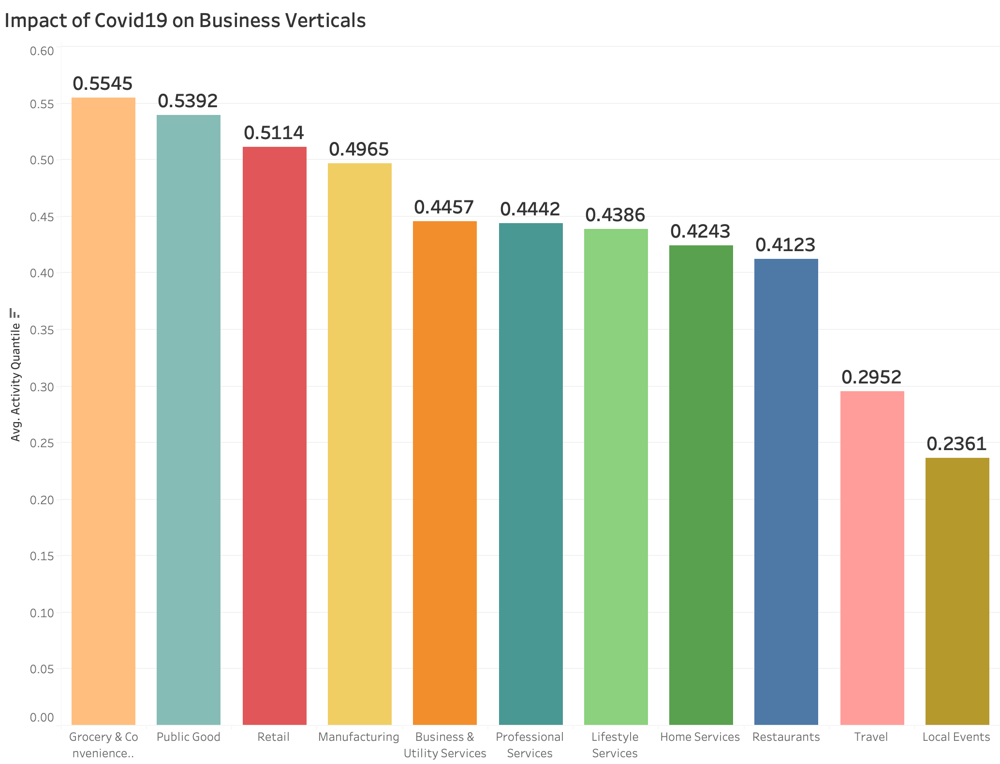

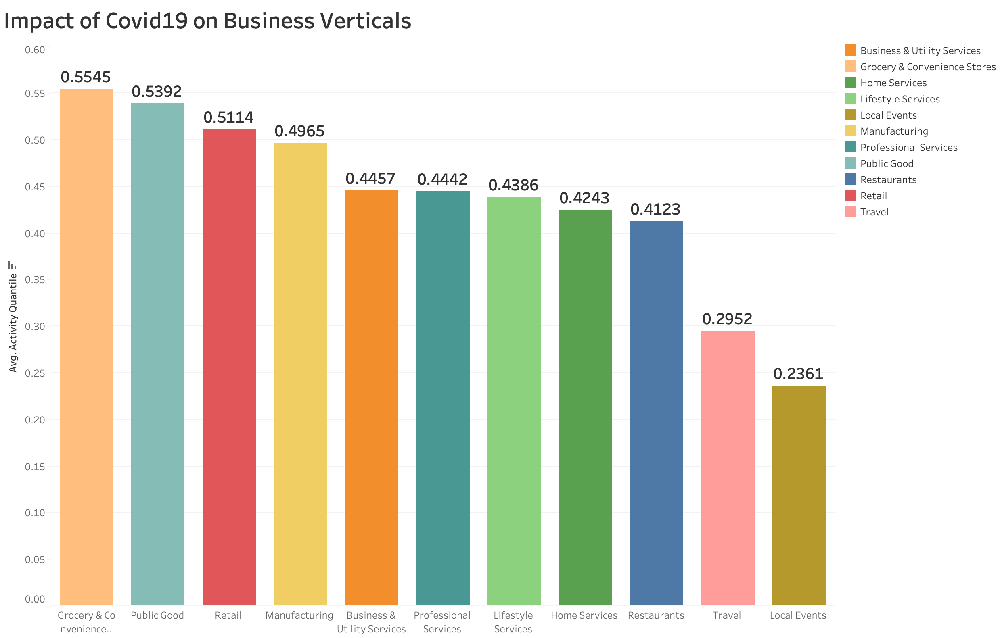

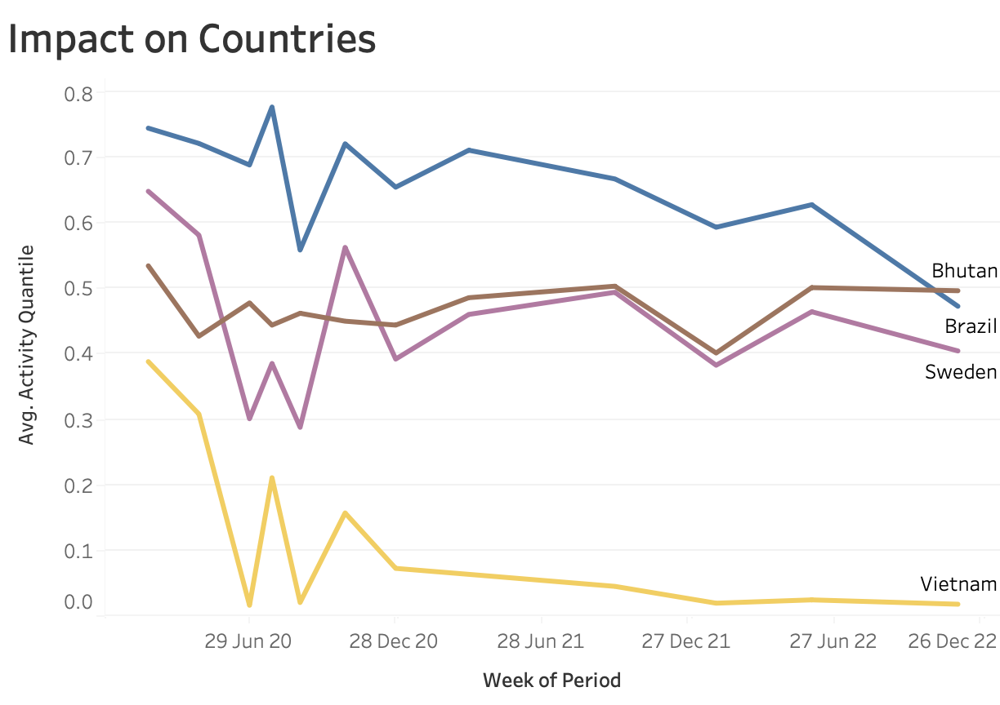

![image.png](attachment:image.png)

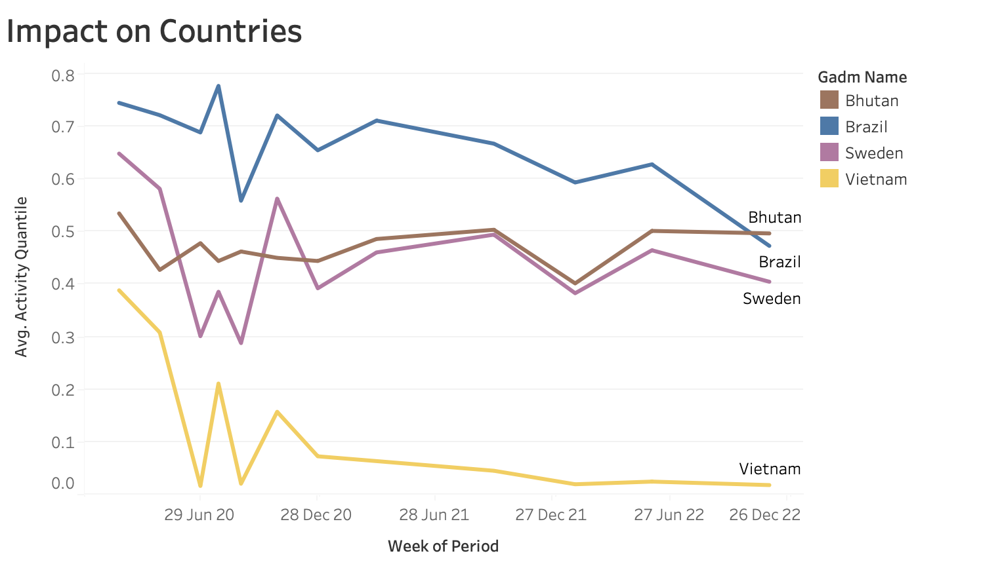

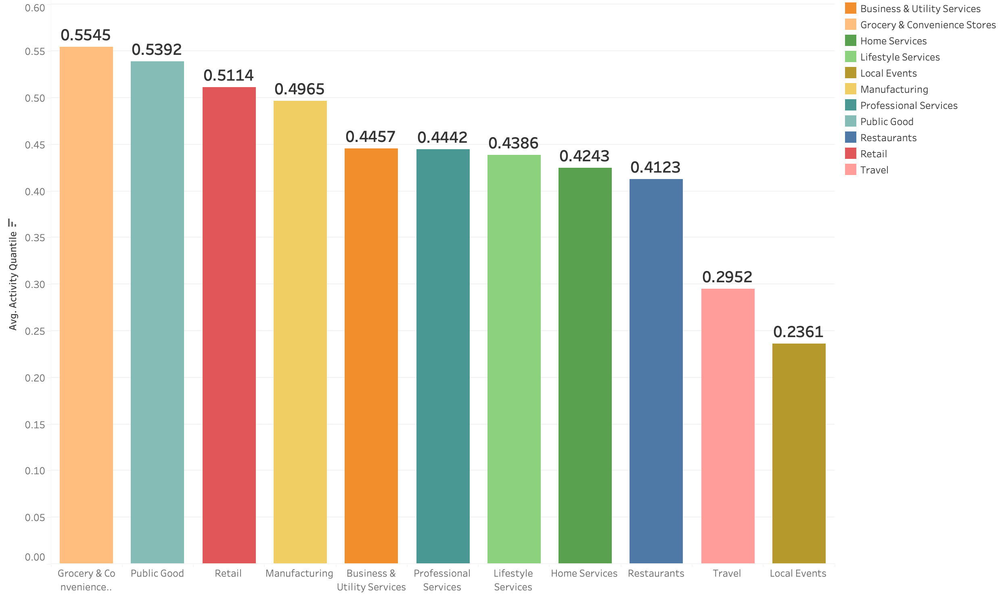

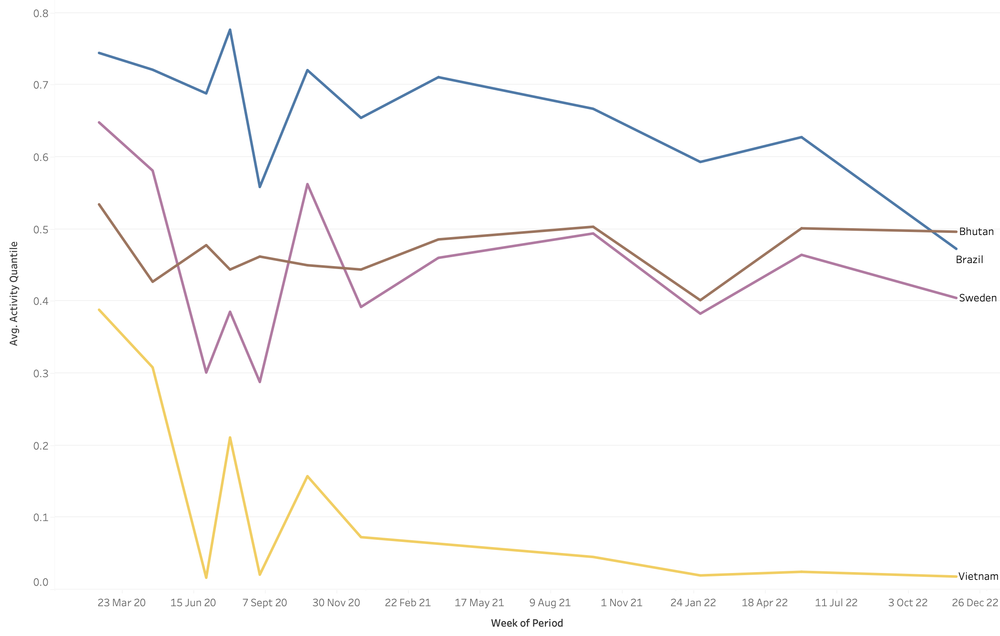

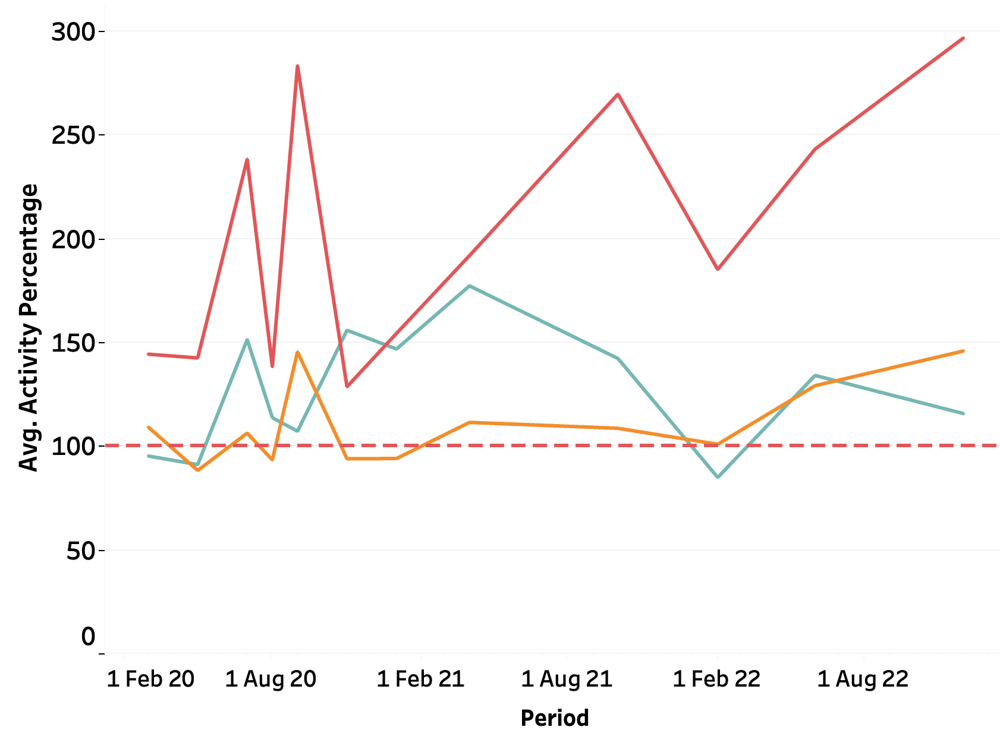

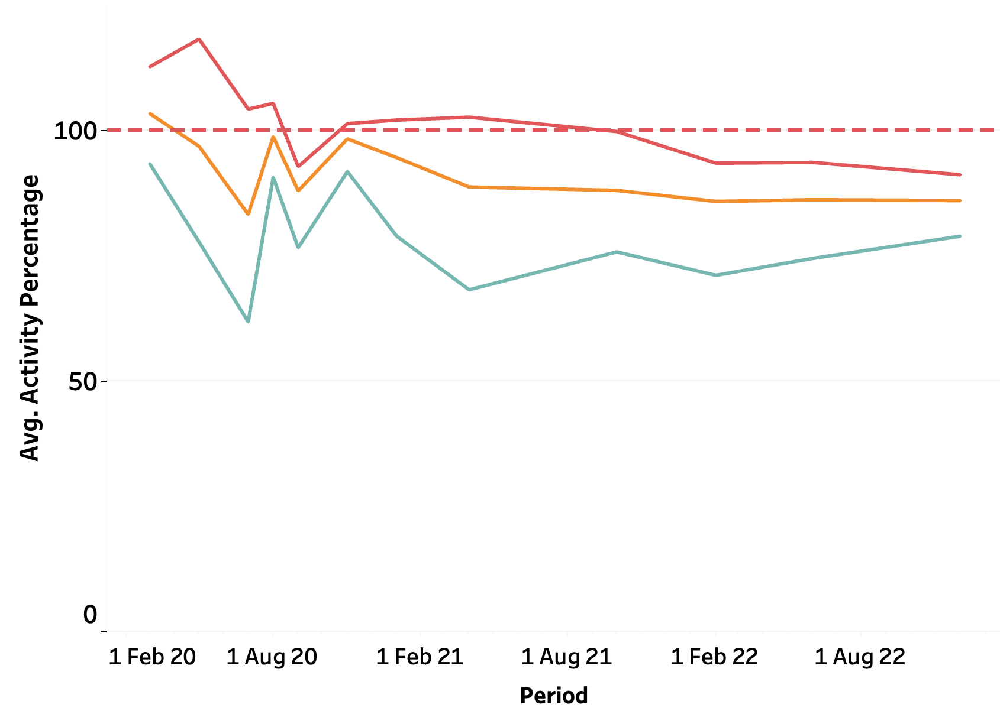

...

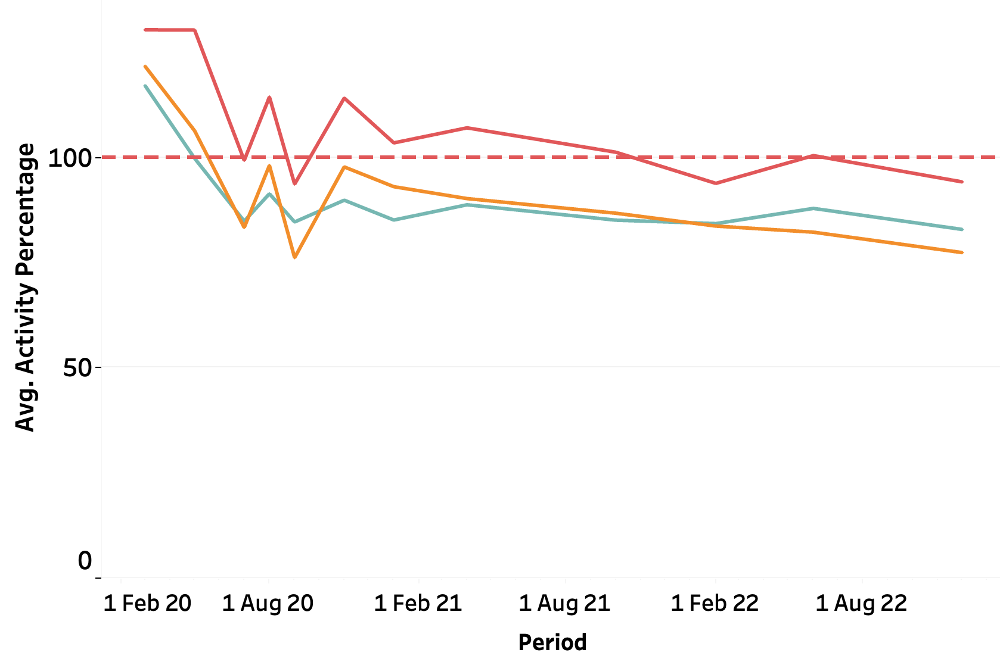

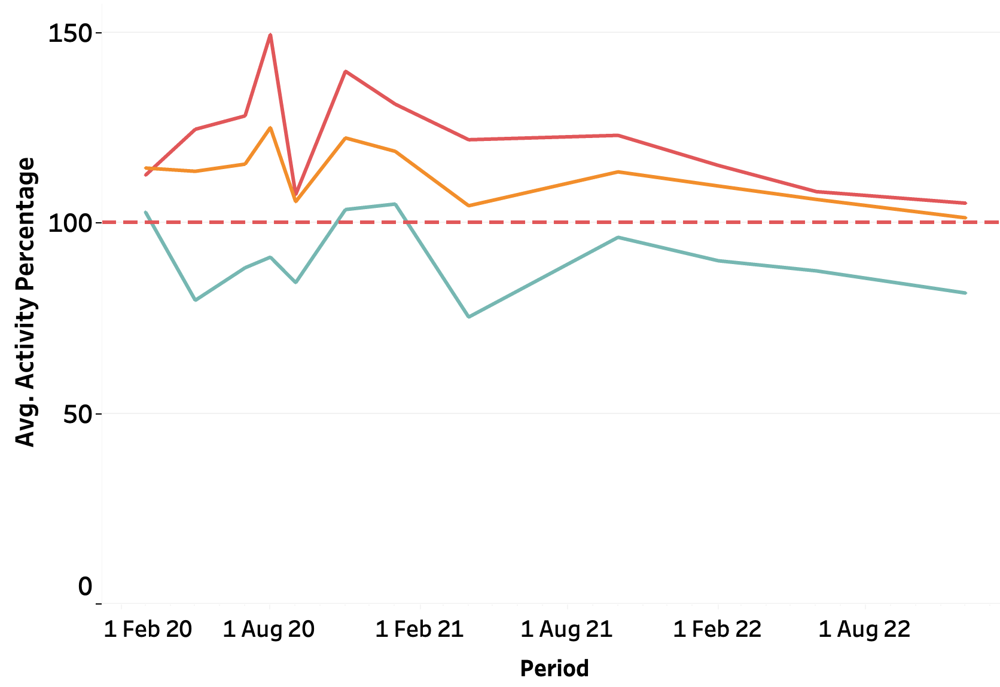

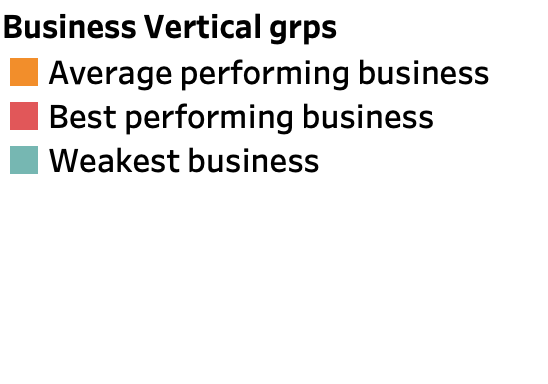

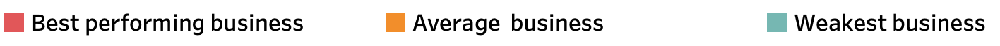

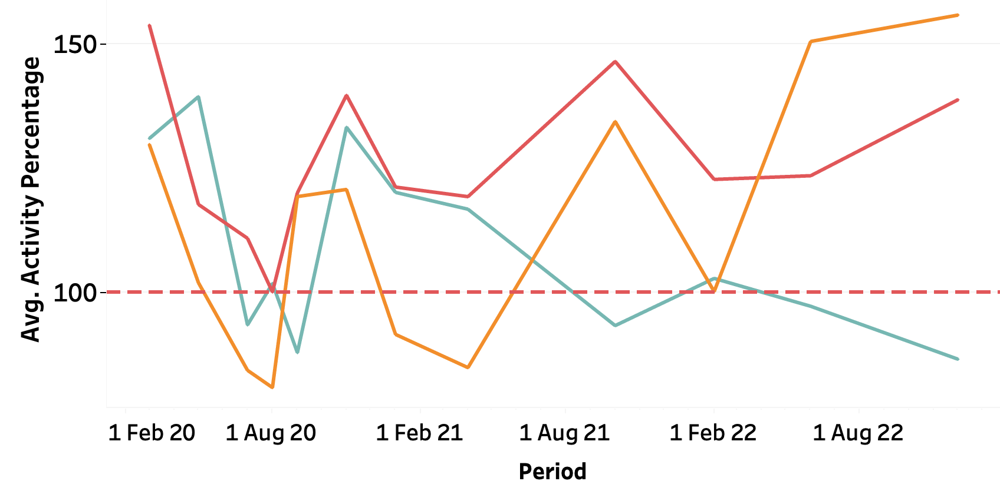